# Cinematography in Times of Crisis

## Question 1

In [6]:
import pandas as pd
from collections import Counter
import ast
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.simplefilter("ignore")
from scipy.signal import find_peaks
from scipy import stats
import plotly.express as px
import plotly.graph_objects as go
from itertools import combinations
from collections import Counter
import networkx as nx
from scipy.stats import chi2_contingency
from src.utils.utils_Q1 import *

In [7]:
# Import data
data = pd.read_csv("data/data_Q1.csv")
df_wars = pd.DataFrame(data)
df_movies = pd.read_csv("data/filtered_movie_data.csv")
# Filtering the data considering years in the dataframes
df_wars = df_wars[(df_wars["StartYear"] >= 1931) & (df_wars["EndYear"] <= 2012)]
df_movies = df_movies[(df_movies["Year"] >= 1931) & (df_movies["Year"] <= 2012)]

Genres were inspected for key words for further analysis.

In [8]:
'''
Looking for genres based on the chosen key words in order to find interesting and appropriate genres to inspect
'''

# Get the unique genres
df_movies['Genres'] = df_movies['Genres'].apply(lambda x: ast.literal_eval(x) if isinstance(x, str) else x)
exploded_genres = df_movies.explode('Genres')
unique_genres = exploded_genres['Genres'].unique()

# List of word parts to search for in genres
search_terms = ["war", "spy", "patriot", "propagand", "hero", "social", "politic", "apocalyp", "topia"]
pattern = '|'.join(search_terms)  

# Filter genres
matching_genres = [genre for genre in unique_genres if isinstance(genre, str) and pd.Series(genre).str.contains(pattern, case=False, na=False).any()]

# Print the matching genres
print(matching_genres)

['War film', 'Political drama', 'Superhero movie', 'Spy', 'Political cinema', 'Dystopia', 'Political satire', 'Social issues', 'Social problem film', 'Propaganda film', 'Gulf War', 'Political thriller', 'Superhero', 'Apocalyptic and postapocalyptic fiction', 'Antiwar', 'Antiwar film', 'Glamorized Spy Film', 'Nuclear warfare', 'Cold War', 'War effort', 'Patriotic film', 'Political Documetary', 'The Netherlands in World War II']


Cleaning the genres that are identical. Checking genres for enough data.

In [9]:
# Do the cleaning for similar genres found earlier
df_movies = clean_genres(df_movies, "Superhero", "Superhero movie")
df_movies = clean_genres(df_movies, "Antiwar", "Antiwar film")
df_movies = clean_genres(df_movies, "Social issues", "Social problem film")
df_movies = clean_genres(df_movies, "Spy", "Glamorized Spy Film")
df_movies = clean_genres(df_movies, "Family Film", "Family")
df_movies = clean_genres(df_movies, "Romance Film", "Romance")

# Identified the genres from the list that are encountered too rarely for analysis
print(count_genre_over_years(df_movies, "Patriotic film")["Count"].sum())
print(count_genre_over_years(df_movies, "Nuclear warfare")["Count"].sum())
print(count_genre_over_years(df_movies, "War effort")["Count"].sum())
print(count_genre_over_years(df_movies, "Political Documetary")["Count"].sum())

2.0
2.0
1.0
1.0


To lead a preliminary inspection of war-related genres and chose specific wars for further analysis, three groups of of a few specfic genres were formed: war-related genres, political genres, dystopian genres.

Military (War-related) genres: War Film, Antiwar, Superhero, Spy

Political genres: Political Thriller, Political Satire, Political Cinema, Political Drama

Dystopian genres: Dystopia, Apocalyptic and Postapocalyptic Fiction

In [10]:
# Identified the genres to inspect, grouped the genres into groups of similar theme for further analysis
inspected_genres = ["War film", "Spy", "Superhero", "Antiwar", "Social issues", "Political satire", "Political thriller", "Political cinema", "Political drama", "Dystopia", "Apocalyptic and postapocalyptic fiction"]
military_genres = ["War film", "Spy", "Superhero"]
military_and_antiwar = ["War film", "Spy", "Superhero", "Antiwar"]
reflecting_genres = ["Political satire", "Political thriller", "Political cinema", "Political drama"]
dystopian_genres = ["Dystopia", "Apocalyptic and postapocalyptic fiction"]
positive_genres = ["Family Film", "Romance Film", "Comedy", "Romantic comedy", "Fantasy"]

We were interested in the times when spikes appeared for each genre group. Thus, the peaks for these genre groups were inspected, and a list of events in the 2-year window around the peak year was formed to analyze further. The plots were done for proportions for genre groups over time

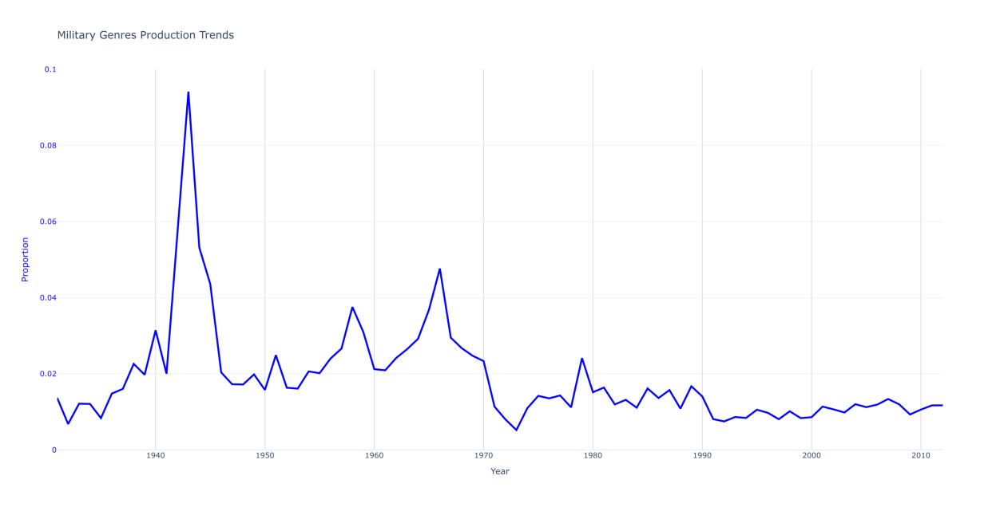

                   War Name
0             First Kashmir
1             Russo-Finnish
2                 Iran-Iraq
3                  Nomonhan
4              Arab-Israeli
5              World War II
6       Third Sino-Japanese
7               Franco-Thai
8               Changkufeng
9   Second Laotian, Phase 2
10     Conquest of Ethiopia
11     Vietnam War, Phase 2
12                 Cold War
13           Second Kashmir


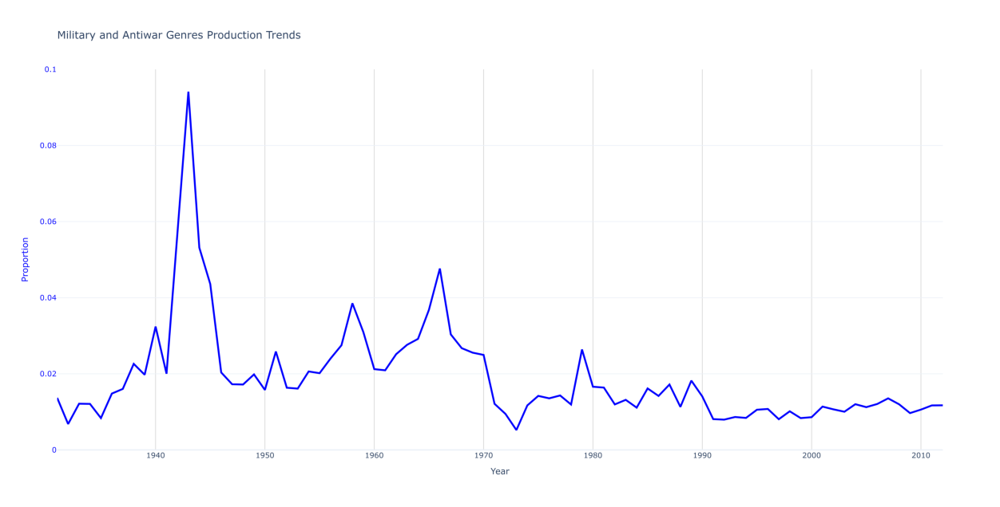

                   War Name
0             First Kashmir
1             Russo-Finnish
2                 Iran-Iraq
3                  Nomonhan
4              Arab-Israeli
5              World War II
6       Third Sino-Japanese
7               Franco-Thai
8               Changkufeng
9   Second Laotian, Phase 2
10                 Cold War
11     Vietnam War, Phase 2
12           Second Kashmir


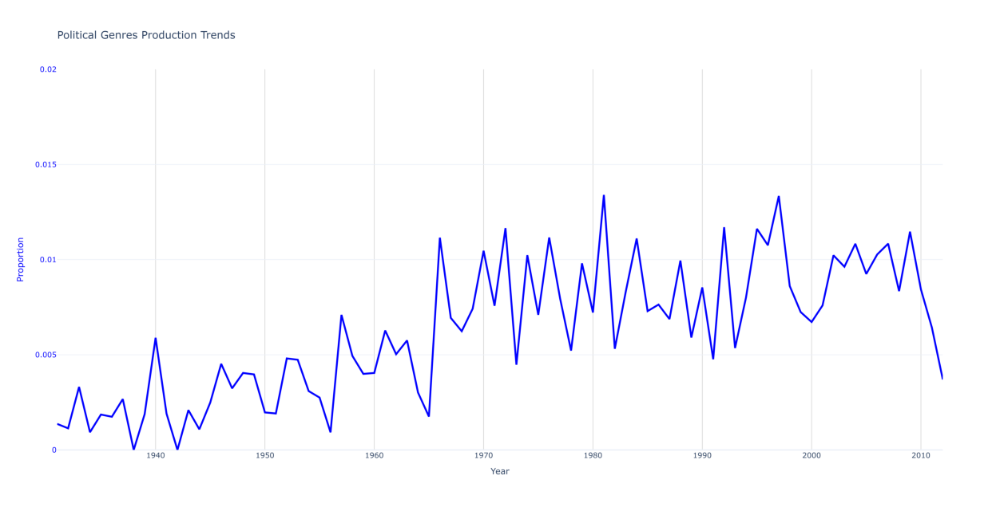

                    War Name
0                  Iran-Iraq
1               Badme Border
2       Vietnamese-Cambodian
3   Sino-Vietnamese Punitive
4         Ugandian-Tanzanian
5             Azeri-Armenian
6        Communist Coalition
7      Bangladesh Liberation
8    Second Laotian, Phase 2
9             Yom Kippur War
10                  Cold War
11      Vietnam War, Phase 2
12             Turco-Cypriot


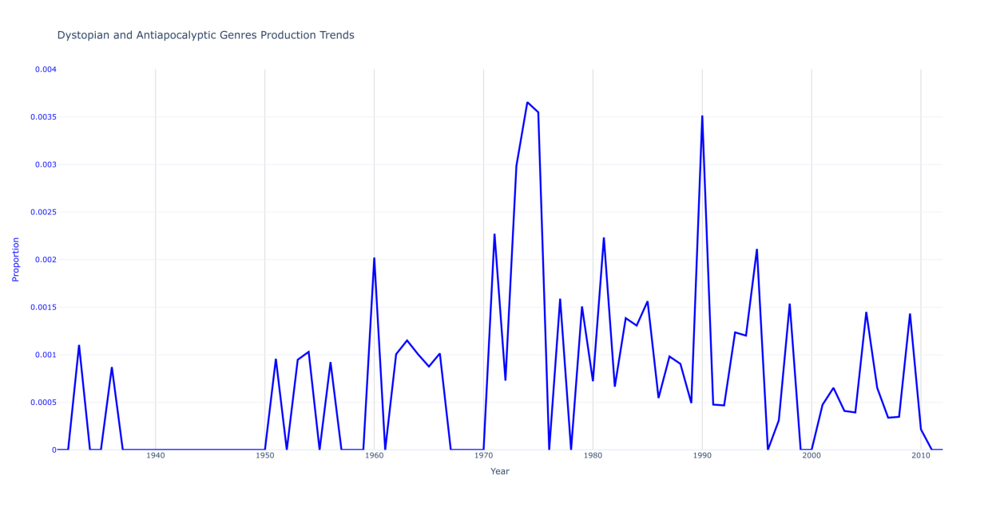

                      War Name
0                    Iran-Iraq
1               Yom Kippur War
2         Vietnamese-Cambodian
3     Sino-Vietnamese Punitive
4           Ugandian-Tanzanian
5   Second Ogaden War, Phase 2
6               Azeri-Armenian
7                        Assam
8          Communist Coalition
9        Bangladesh Liberation
10               Turco-Cypriot
11     Second Laotian, Phase 2
12             War over Angola
13               Cenepa Valley
14        Vietnam War, Phase 2
15                    Cold War
16              Second Kashmir


In [11]:
military_events = inspect_peaks_events(df_movies, df_wars, military_genres, 0.1, "Military Genres", "trend_numwars_military")
mil_antiwar_peaks = inspect_peaks_events(df_movies, df_wars, military_and_antiwar, 0.1, "Military and Antiwar Genres", "trend_numwars_antiwarmilitary")
polit_peaks = inspect_peaks_events(df_movies, df_wars, reflecting_genres, 0.02, "Political Genres", "trend_numwars_political")
dystop_peaks = inspect_peaks_events(df_movies, df_wars, dystopian_genres, 0.004, "Dystopian and Antiapocalyptic Genres", "trend_numwars_dystopian")

The events that were chosen appeared in at least two of the final lists and had more than 1000 movies released in their timeline (a sperate group of War movies without the Antiwar was created as well, since the movies specifically labelled Antiwar are of a different nature). The comprehensive list of events to analyzed was yielded:

In [12]:
'''
From the final_df's produced for each group of genres, find the wars that appear in at least 2 dataframes and filter for more than 2000 movies released
in the period of the war in order to define the wars most interesting for further analysis.
'''

military_events = set(military_events['War Name'])
mil_antiwar_peaks = set(mil_antiwar_peaks['War Name'])
polit_peaks = set(polit_peaks['War Name'])
dystop_peaks = set(dystop_peaks['War Name'])

# Combine all sets into a list for easier iteration
war_name_sets = [military_events, mil_antiwar_peaks, polit_peaks, dystop_peaks]

# Use a dictionary to count occurrences of each war name across the DataFrames
from collections import Counter

war_name_counter = Counter()

# Count occurrences of each war name in the union of all sets
for war_set in war_name_sets:
    war_name_counter.update(war_set)

# Get the list of war names that appear in at least two DataFrames
at_least_two = [war for war, count in war_name_counter.items() if count >= 2]

print("War Names present in at least 2 dataframes:", at_least_two)
movies_released = {}
for warname in at_least_two:
    war = df_wars[df_wars["WarName"] == warname]
    starting = war["StartYear"].values[0]
    ending = war["EndYear"].values[0]
    releases = df_movies[(df_movies["Year"] >= starting) & (df_movies["Year"] <= ending)].shape[0]
    movies_released[warname] = releases
    
filtered_wars = {key: value for key, value in movies_released.items() if value >= 2000}
print(filtered_wars)

War Names present in at least 2 dataframes: ['First Kashmir', 'Russo-Finnish', 'Iran-Iraq', 'Nomonhan', 'Arab-Israeli', 'World War II', 'Third Sino-Japanese', 'Franco-Thai', 'Changkufeng', 'Second Laotian, Phase 2', 'Cold War', 'Vietnam War, Phase 2', 'Second Kashmir', 'Vietnamese-Cambodian', 'Sino-Vietnamese Punitive', 'Ugandian-Tanzanian', 'Azeri-Armenian', 'Communist Coalition', 'Bangladesh Liberation', 'Yom Kippur War', 'Turco-Cypriot']
{'Iran-Iraq': 4412, 'World War II': 2162, 'Second Laotian, Phase 2': 2384, 'Cold War': 18052, 'Vietnam War, Phase 2': 4246}


The resulting data frame with the chosen wars

In [13]:
'''
DataFrame with the chosen wars
'''
wars_inspect = []
chosen_wars = pd.DataFrame()
for k, v in filtered_wars.items():
    wars_inspect.append(k)
    thewar = df_wars[df_wars["WarName"] == k]
    chosen_wars = pd.concat([chosen_wars, thewar], ignore_index=True)
chosen_wars = chosen_wars[~chosen_wars["WarName"].duplicated(keep='first')]
print(chosen_wars)

                   WarName  Side  StartYear  EndYear  \
0                Iran-Iraq     1       1980     1988   
2             World War II     1       1939     1945   
4  Second Laotian, Phase 2     1       1968     1973   
6                 Cold War     1       1947     1991   
8     Vietnam War, Phase 2     1       1965     1975   

                                           StateName    BatDeath  
0                                           ['Iran']    750000.0  
2  ['Belgium', 'Yugoslavia', 'Norway', 'Canada', ...  10717907.0  
4                                        ['Vietnam']      2250.0  
6                          ['United States America']         0.0  
8                                        ['Vietnam']    700000.0  


The correlations for a list of specific genres and genre groups were conducted vs. nimber of ongoing wars and vs. battle deaths. The plots with correlation value >= 0.45 were visualized.

Superhero and Number of Wars Correlation 1950-2012:
 -0.4841373873774589 5.815125454474845e-05


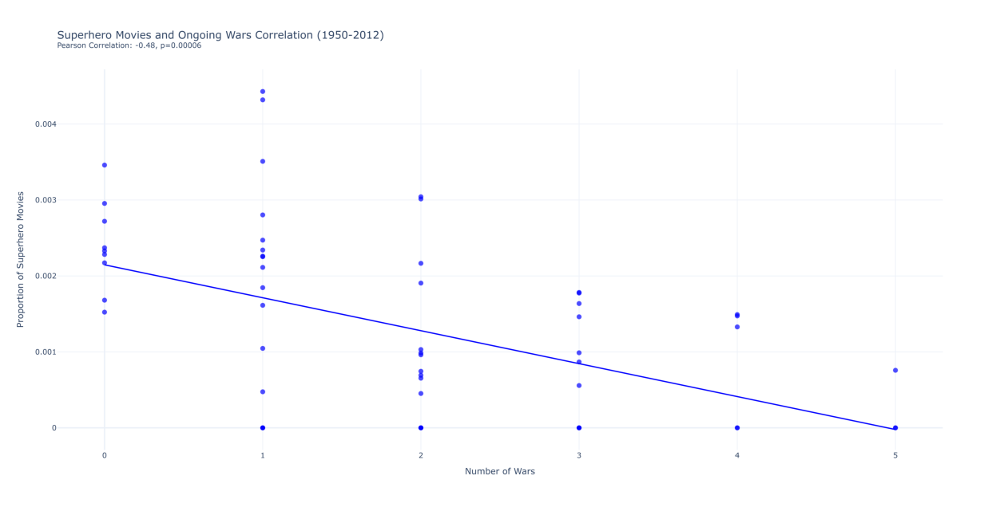

Romantic comedy and Number of Wars Correlation 1950-2012:
 -0.560637859945392 1.764692369781929e-06


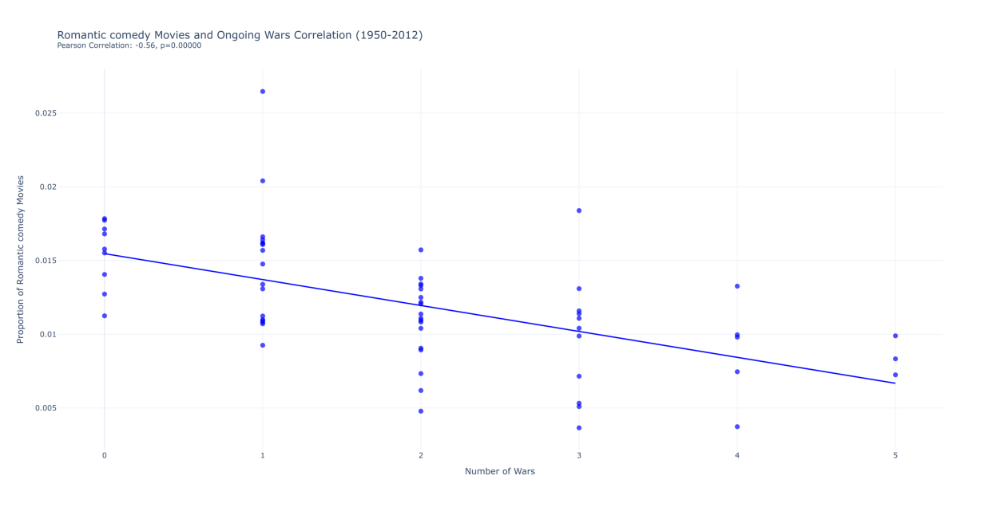

Family Film and Number of Wars Correlation 1978-1990:
 0.45778661785706853 0.11571143063754766


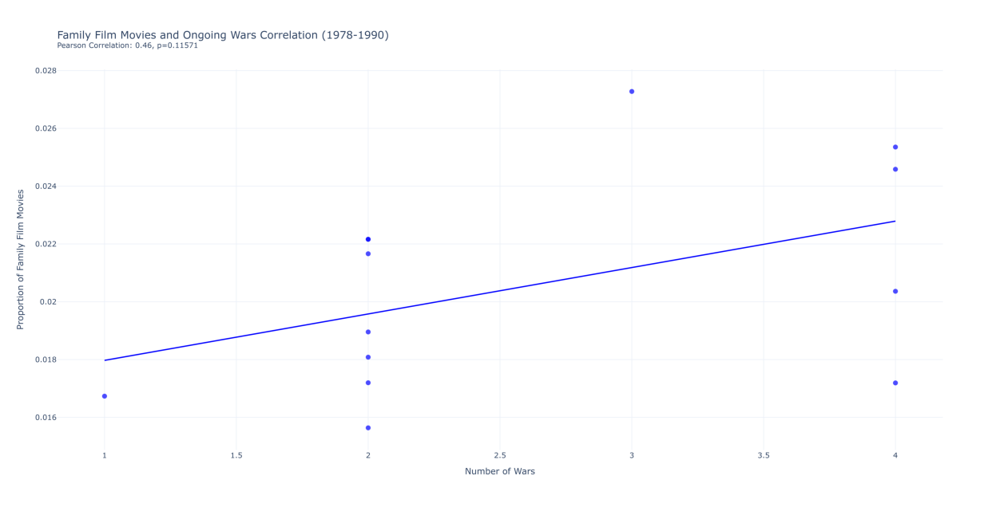

Disaster and Number of Wars Correlation 1978-1990:
 0.5217145717502831 0.06745471685678181


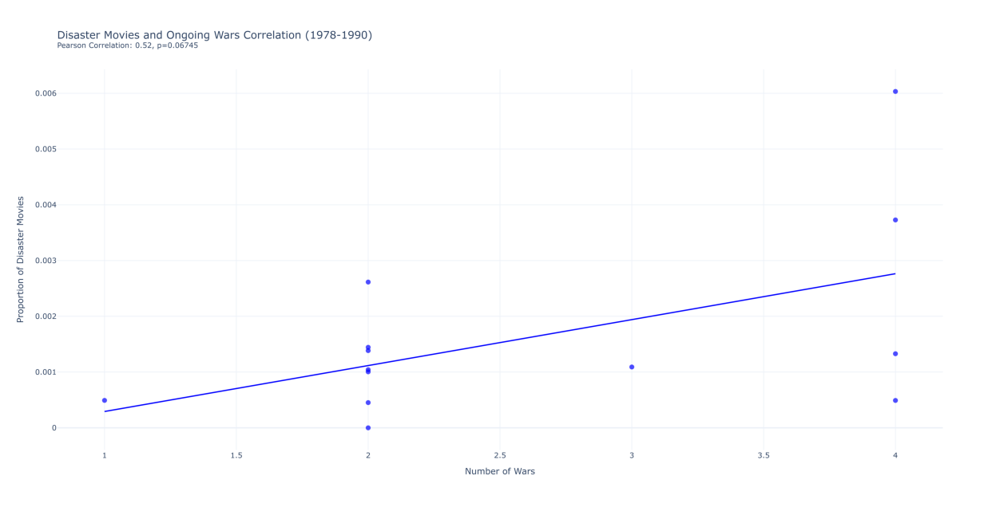

Romantic comedy and Number of Wars Correlation 1947-1991:
 -0.4506173070283014 0.0018944734201382634


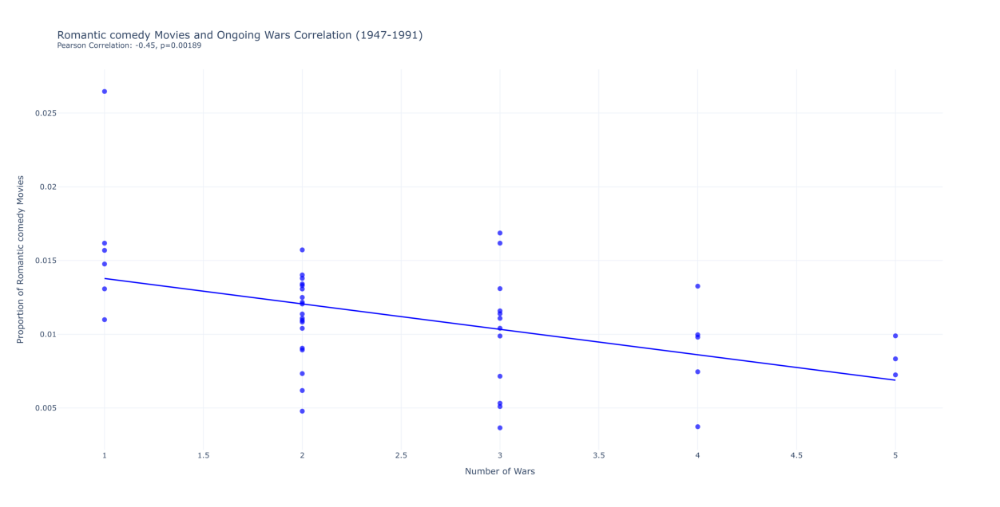

Thriller and Number of Wars Correlation 1937-1947:
 -0.49338964428287374 0.1230166944867473


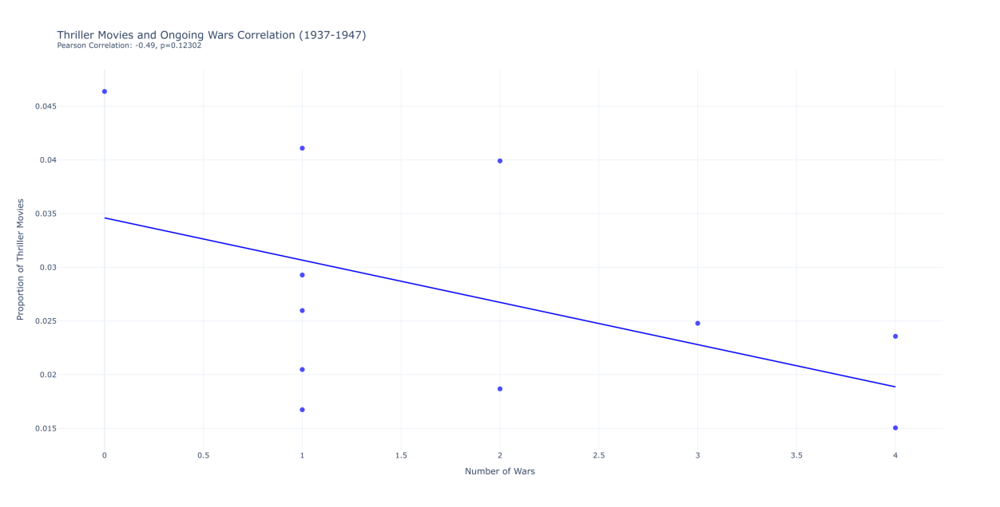

Antiwar and Number of Wars Correlation 1937-1947:
 0.5448919310237997 0.08303212332938935


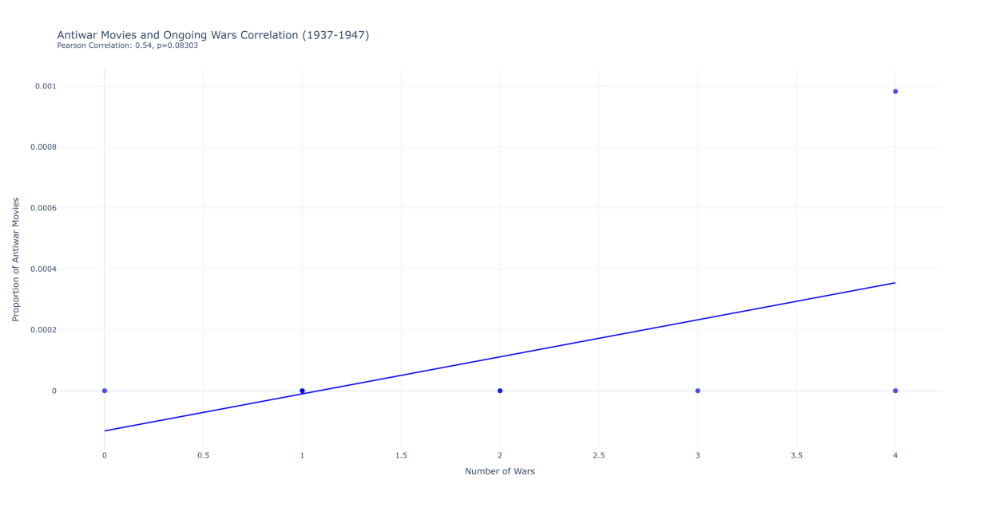

Disaster and Number of Wars Correlation 1937-1947:
 0.45759626678466775 0.1570051099098849


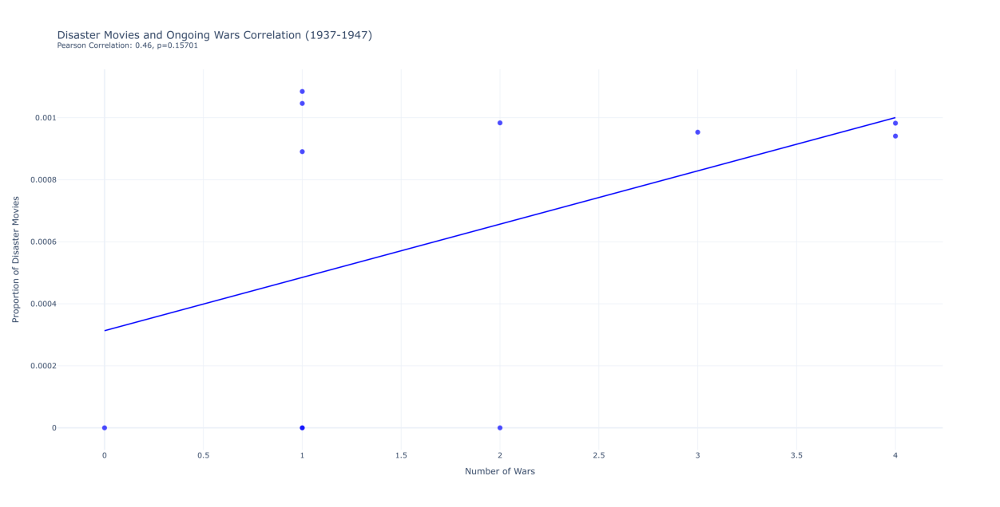

Family Film and Number of Wars Correlation 1963-1977:
 -0.6107573178148687 0.015583513073592504


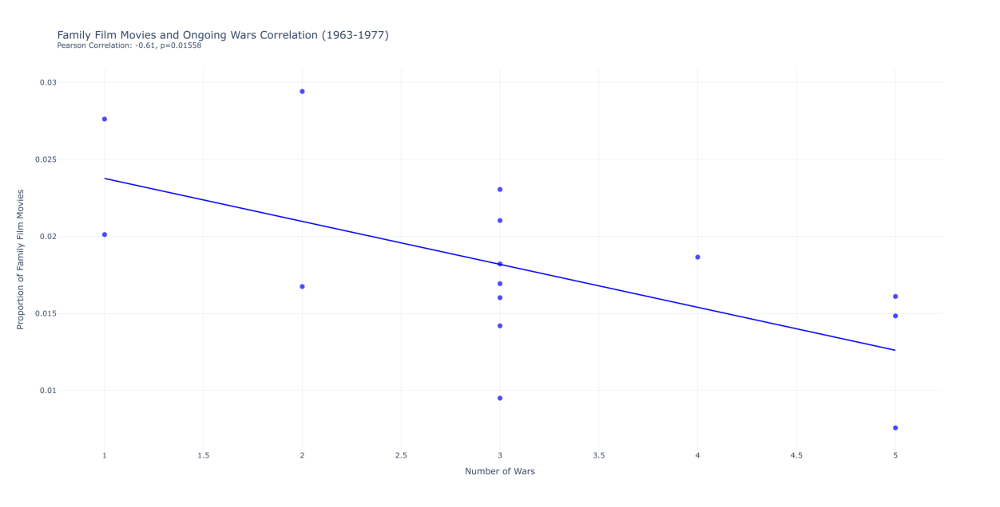

Romantic comedy and Number of Wars Correlation 1963-1977:
 -0.4966499028999851 0.05966576799722447


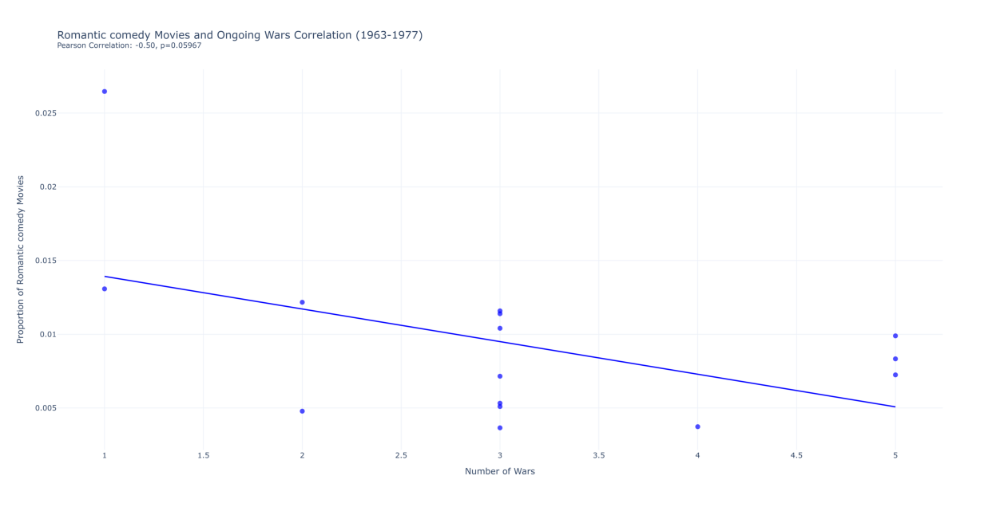

Social issues and Number of Wars Correlation 1990-2012:
 -0.5008439056090079 0.014920703212376756


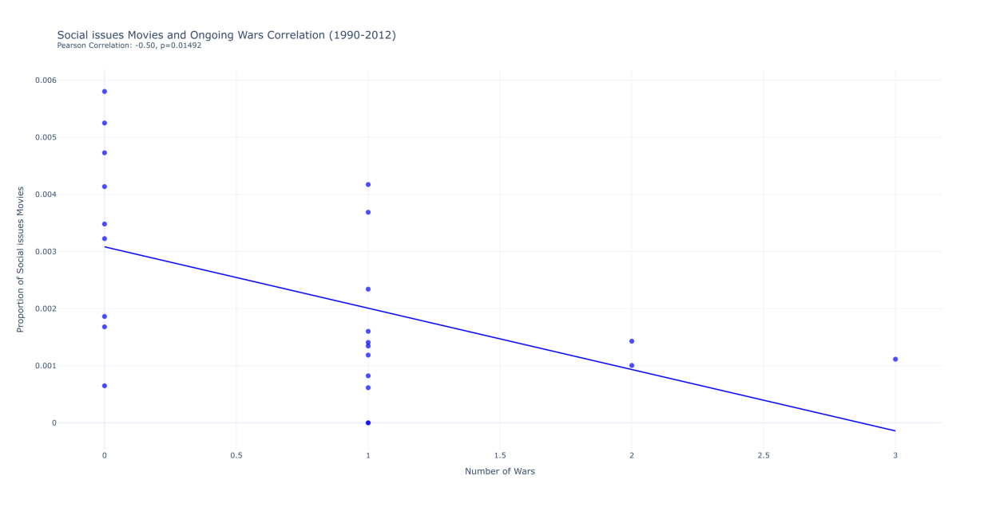

Political Movies and Number of Wars Correlation 1990-2012:
 -0.5483382551604976 0.006747061757120204


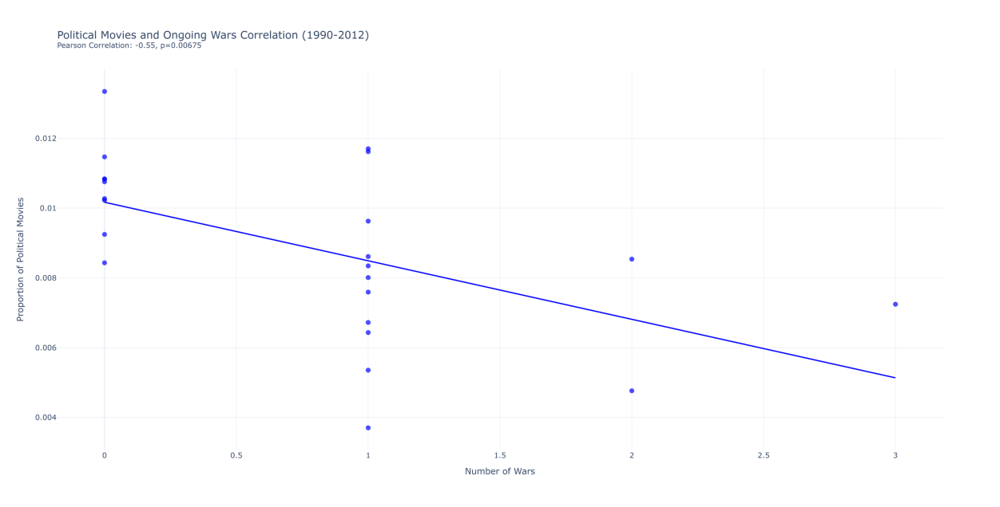

In [15]:
military_df = sum_genres_proportions(df_movies, military_genres)
military_antiwar_df = sum_genres_proportions(df_movies, military_and_antiwar)
reflecting_df = sum_genres_proportions(df_movies, reflecting_genres)
dystopian_df = sum_genres_proportions(df_movies, dystopian_genres)
positive_df = sum_genres_proportions(df_movies, positive_genres)

bat_deaths_yearly = calc_bat_deaths(df_wars)
wars_yearly = wars_per_year(df_wars)

'''
Define the ranges for the functions. 
(1931-2012) - overall range
(1950-2012) - overall without the WW2 specifically because the increased Battle Deaths skew the data
(1978-1990) - Iran-Iraq War
(1947-1991) - Cold War
(1963-1977) - Vietnam War, Phase 2 (2nd Laotian War not included due to very similar range of 1968-1975)
(1990-2012) - The interval was taken for further inspection since the 21st century was not represented in the intervals before
'''
year_ranges = [(1931, 2012), (1950, 2012), (1978, 1990), (1947, 1991), (1937, 1947), (1963, 1977), (1990, 2012)]

# List of single genres for inspection (Previosly not mentioned: Horror, Thriller, Disaster)
genres = ["War film", "Spy", "Superhero", "Romance Film", "Romantic drama", "Family Film", 
          "Romantic comedy", "Comedy", "Fantasy", "Thriller", "Horror", 
          "Drama", "Social issues", "Antiwar", "Disaster"]

# Calculating the correlation and plotting proportion vs. number of wars with the OLS. Displaying only for the correlation value at least 0.45
for year_cut1, year_cut2 in year_ranges:
    for genre in genres:
        genre_yearly = count_genre_proportion(df_movies, genre)
        # Print correlation
        corr_val, p_val = correlation_genre_cut(genre_yearly, wars_yearly, year_cut1, year_cut2)
        if abs(corr_val) >= 0.45:
            print(f"{genre} and Number of Wars Correlation {year_cut1}-{year_cut2}:\n", corr_val, p_val)
            
            # Plot
            plot_proportion_vs_number_wars(genre_yearly, wars_yearly, genre, year_cut1, year_cut2, f"corr_numwars_{genre}_{year_cut1}-{year_cut2}")

    # Plot and print correlations for the groups of genres
    for name, df_genres in [("Military", military_df),
                            ("Military & Antiwar", military_antiwar_df),
                            ("Political", reflecting_df),
                            ("Dystopian", dystopian_df),
                            ("Positive", positive_df)]:
        corr_val, p_val = correlation_genre_cut(df_genres, wars_yearly, year_cut1, year_cut2)
        if abs(corr_val) >= 0.45:
            print(f"{name} Movies and Number of Wars Correlation {year_cut1}-{year_cut2}:\n", corr_val, p_val)
            plot_proportion_vs_number_wars(df_genres, wars_yearly, name, year_cut1, year_cut2, f"corr__numrwars_{name}_{year_cut1}-{year_cut2}")

War film and Battle Death Correlation 1931-2012:
 0.596340823461141 3.3886994894754998e-09


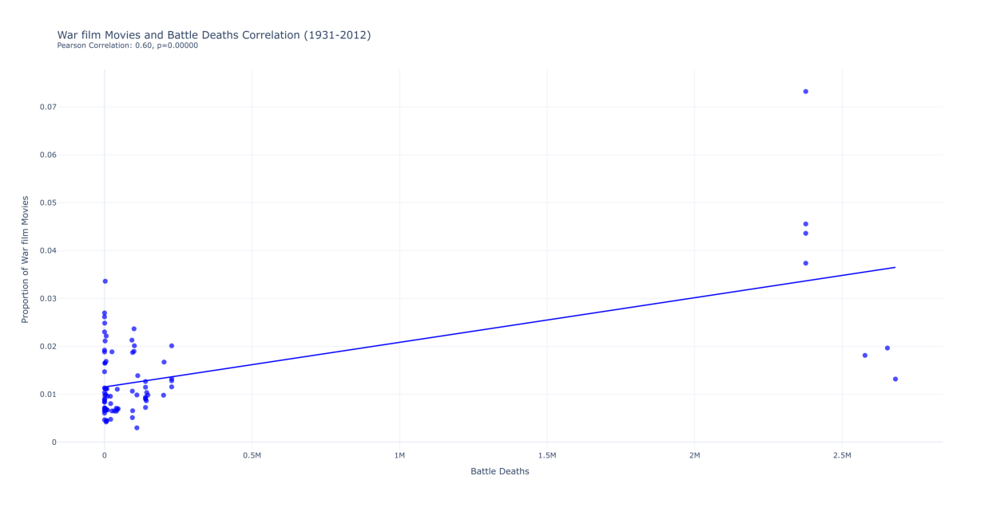

Military Movies and Battle Death Correlation 1931-2012:
 0.6000537866850301 2.5546593469460125e-09


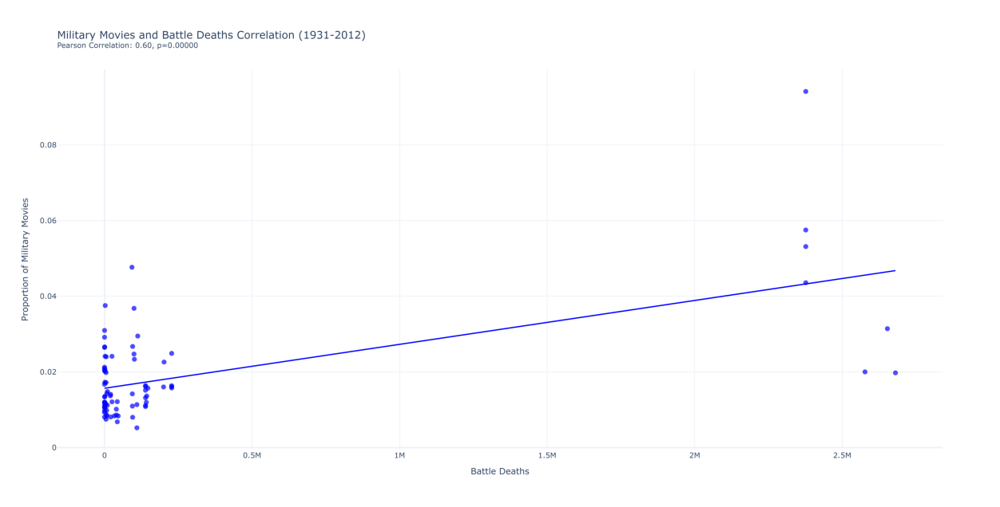

Military & Antiwar Movies and Battle Death Correlation 1931-2012:
 0.5961905881237832 3.427401559214669e-09


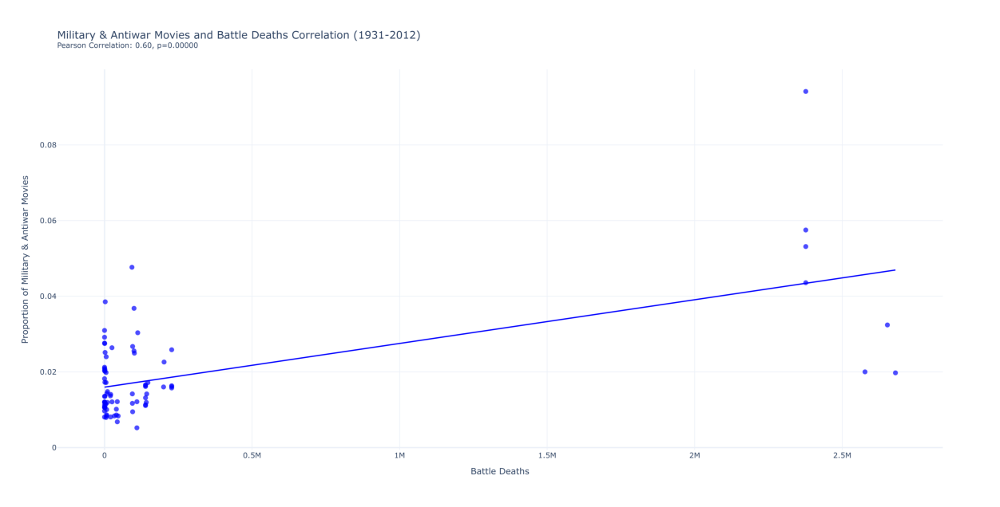

Superhero and Battle Death Correlation 1978-1990:
 -0.5091067739404107 0.07558380102335384


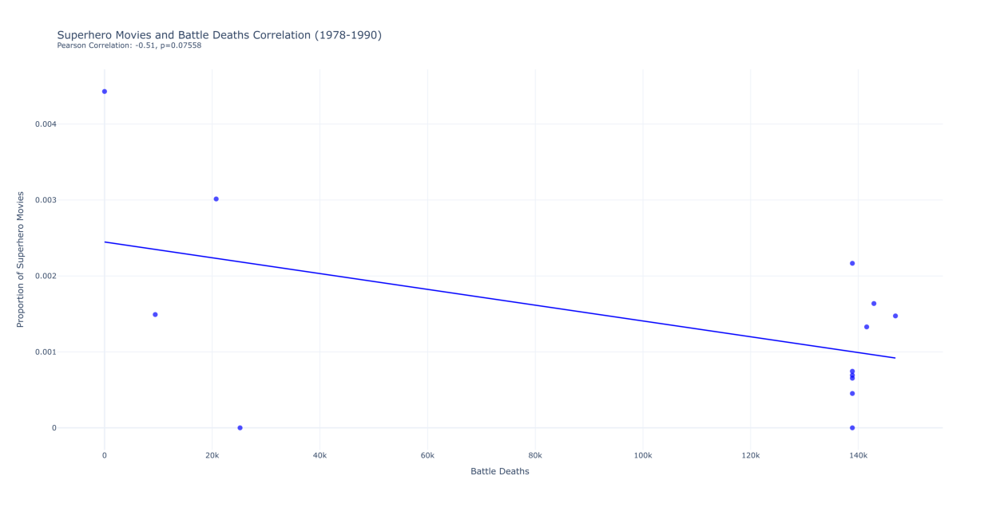

Disaster and Battle Death Correlation 1978-1990:
 -0.45923201200545566 0.114418673064398


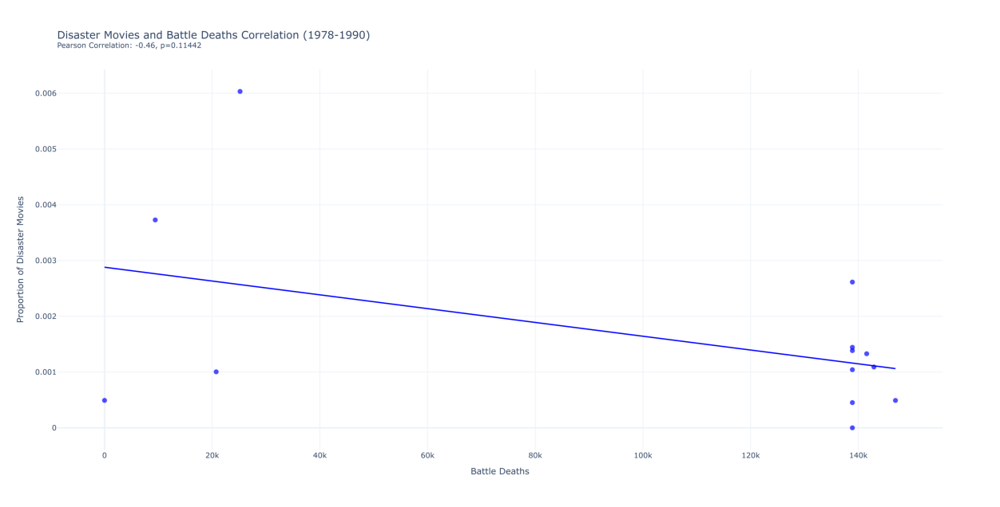

War film and Battle Death Correlation 1937-1947:
 0.5158609356331014 0.10431079912849105


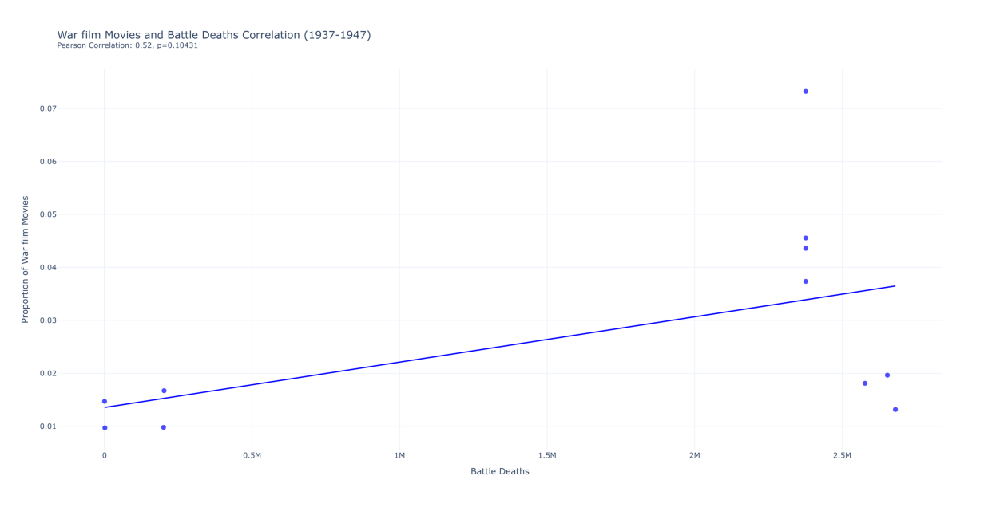

Family Film and Battle Death Correlation 1937-1947:
 -0.7245392387355282 0.01166836814244635


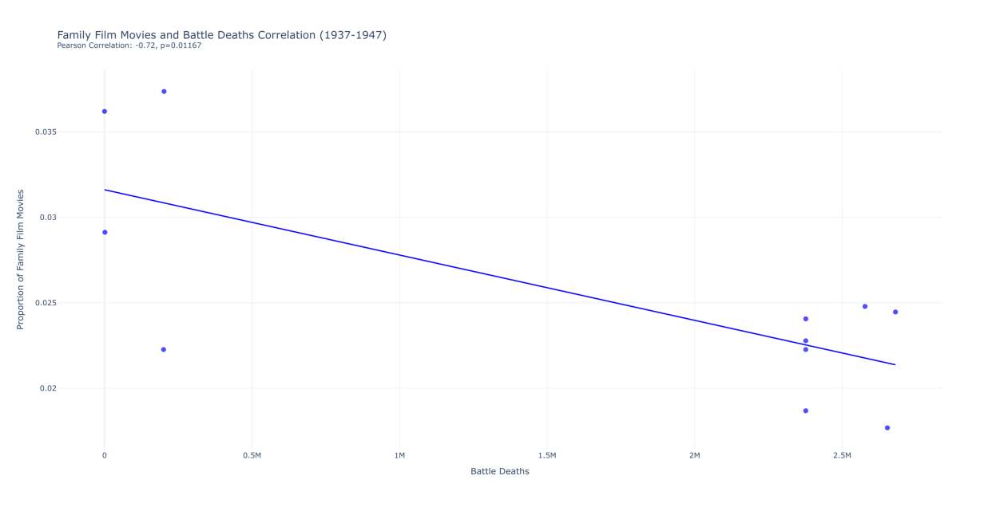

Horror and Battle Death Correlation 1937-1947:
 0.8352299818457185 0.0013728795674569545


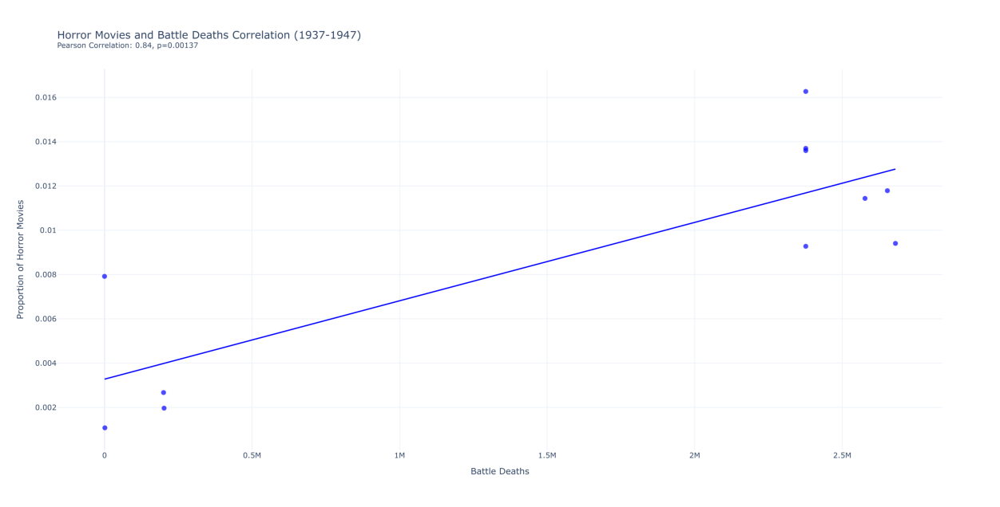

Drama and Battle Death Correlation 1937-1947:
 -0.6088731313537614 0.046795859886631


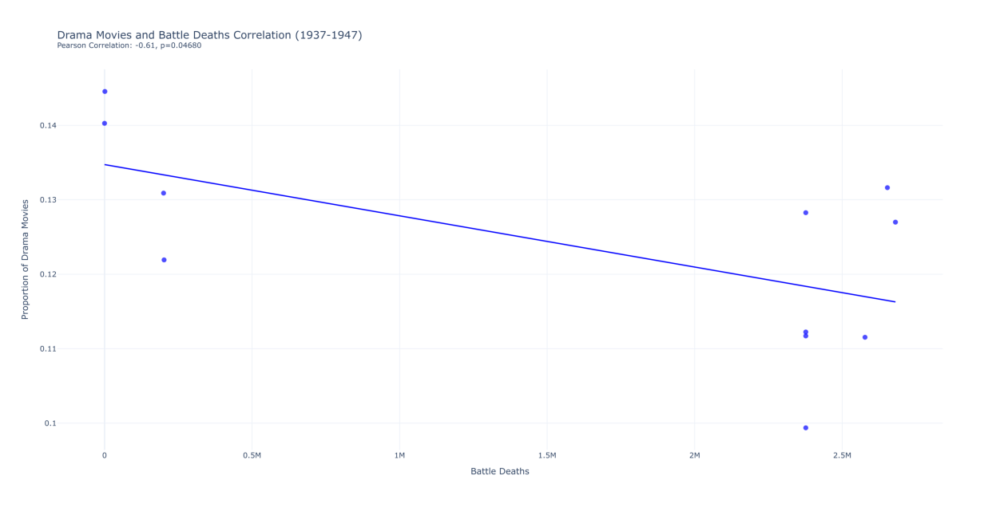

Military Movies and Battle Death Correlation 1937-1947:
 0.4916219730227004 0.12457315724511085


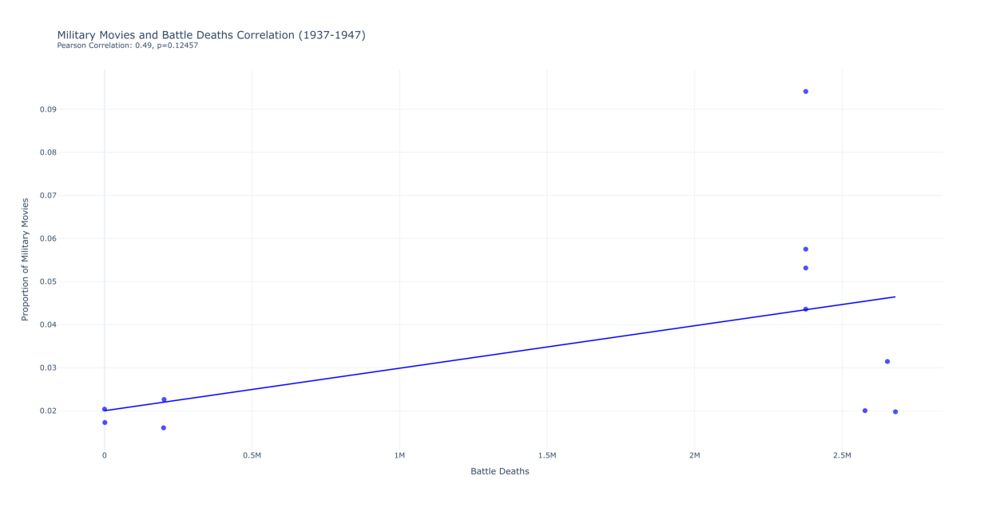

Military & Antiwar Movies and Battle Death Correlation 1937-1947:
 0.49540738408596996 0.12125532965335876


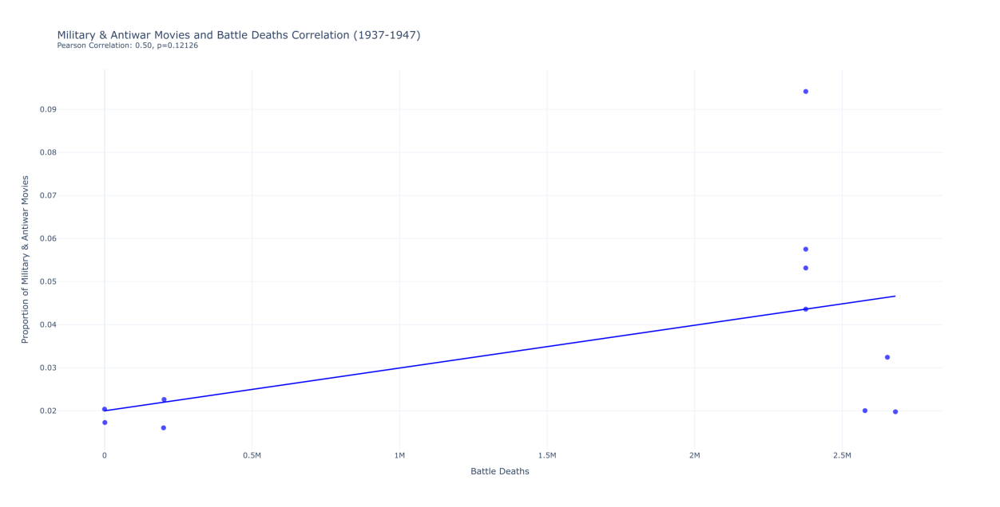

Fantasy and Battle Death Correlation 1963-1977:
 -0.5166464473650403 0.048620508744915546


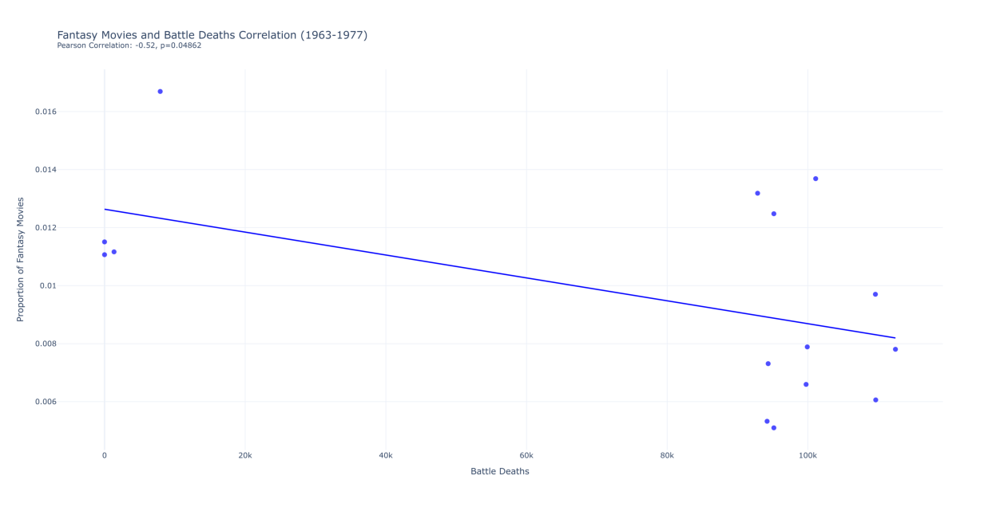

In [16]:
for year_cut1, year_cut2 in year_ranges:
    for genre in genres:
        genre_yearly = count_genre_proportion(df_movies, genre)
        corr_val, p_val = correlation_genre_cut(genre_yearly, bat_deaths_yearly, year_cut1, year_cut2)
        if abs(corr_val) >= 0.45:
            print(f"{genre} and Battle Death Correlation {year_cut1}-{year_cut2}:\n", corr_val, p_val)

        # Plot
            plot_proportion_vs_battle_deaths(genre_yearly, bat_deaths_yearly, genre, year_cut1, year_cut2, f"corr_batdeath_{genre}_{year_cut1}-{year_cut2}")

    # Plot and print for the groups of genres
    for name, df_genres in [("Military", military_df),
                            ("Military & Antiwar", military_antiwar_df),
                            ("Political", reflecting_df),
                            ("Dystopian", dystopian_df),
                            ("Positive", positive_df)]:
        corr_val, p_val = correlation_genre_cut(df_genres, bat_deaths_yearly, year_cut1, year_cut2)
        if abs(corr_val) >= 0.45:
            print(f"{name} Movies and Battle Death Correlation {year_cut1}-{year_cut2}:\n", corr_val, p_val)
            plot_proportion_vs_battle_deaths(df_genres, bat_deaths_yearly, name, year_cut1, year_cut2, f"corr_batdeath_{name}_{year_cut1}-{year_cut2}")


To sum up, while the model often fit weakly or moderately, we can note a few things:

As the number of wars increased, the Family Film production decreased during the times of the Vietnam War, the Romantic comedy production decreased during the second half of the 20th century and for most of the timeline as well. Plotical Movies and Social Issues films decreased for the 1990-2012 timeline. As the number of battle deaths increased, Family Film, Horror, and Drama decreased for the WW2 timeline, but result is skewed. Fantasy decreased for the Vietnam War timeline. All in all, we see a decrease for all kinds of movie genres with the increase of number of ongoing wars and battle deaths. We can note the Family Film and Romantic comedy appear more than once, which could suggest that the wars affect their production greatly.

Network for the War Film genre was visualized.

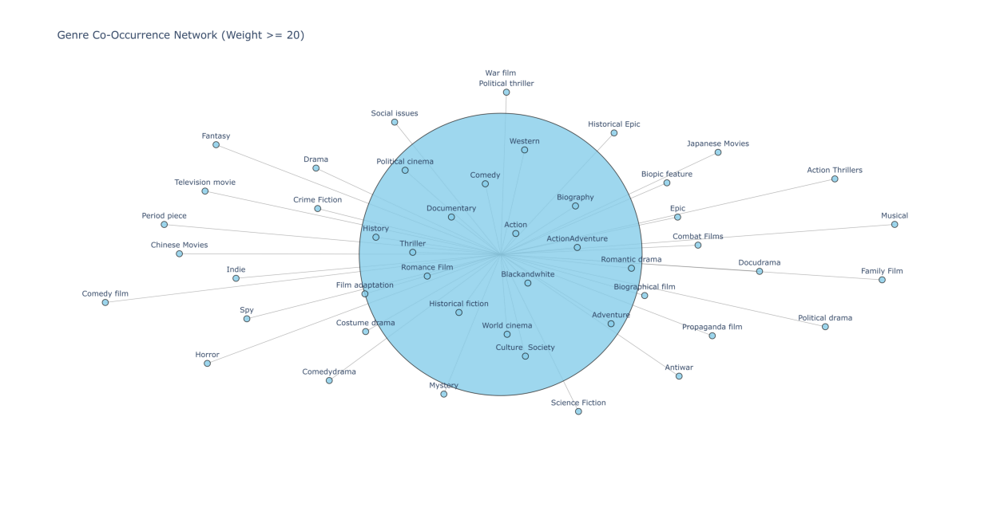

In [17]:
war_genres = ["War film"]
genre_co_occurrence_network_plotly(df_movies, war_genres, min_weight=20)

For some inspection, the network for War Film was created, which is the movie genres that were mentioned together with War Film more often. Some of the observations that can be made from the network are that War Films are often associated with historical or documentary films, with action films, and sometimes with political genres. What is interesting for our analysis is that Comedy, Romance films and Romantic drama often go together with War Films, thus, our objective to inspect the production of more entertaining and escapistic genres may not be supported in full by inspecting these “positive” genres, as they are often included in movies about war as well.

Visualizing significant changes in genres for before, during and after the chosen wars with chi-square testing. The before and after are 5 years from start and end accordingly.

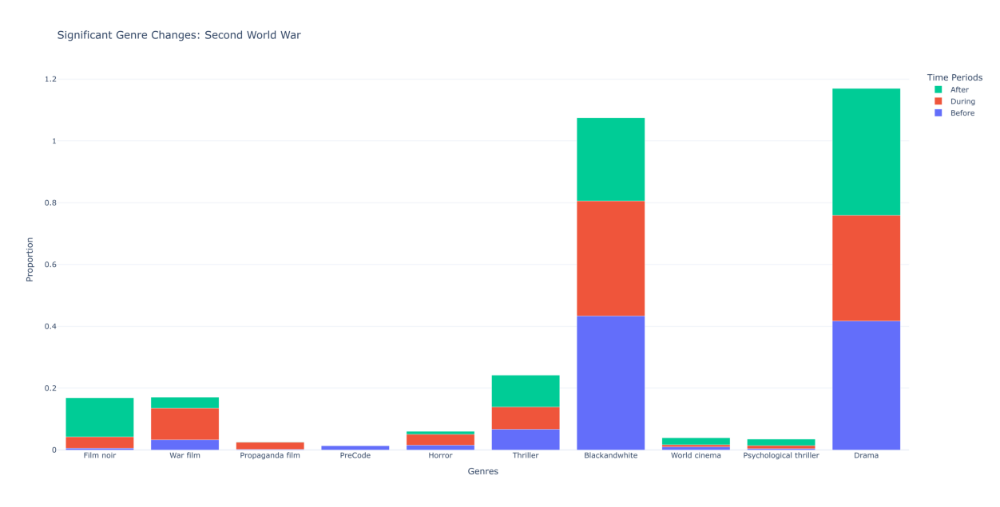

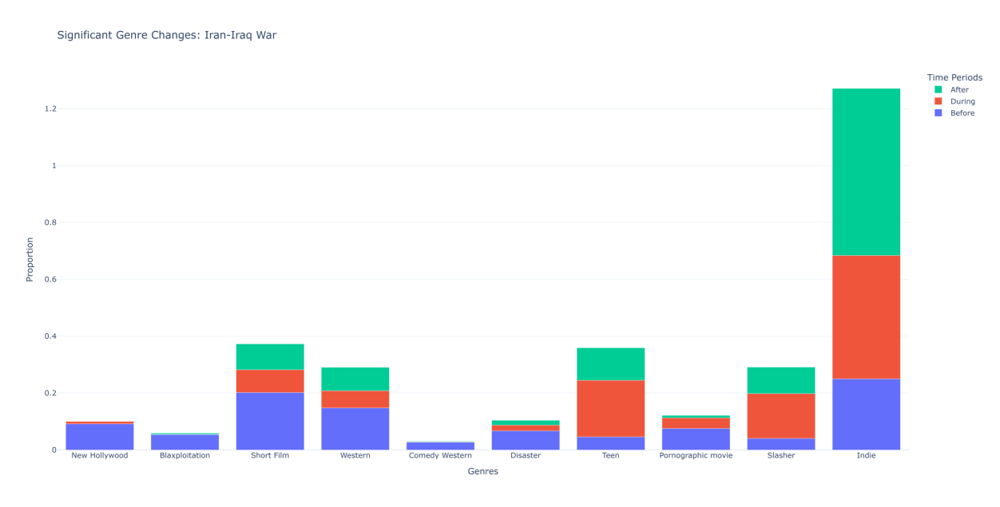

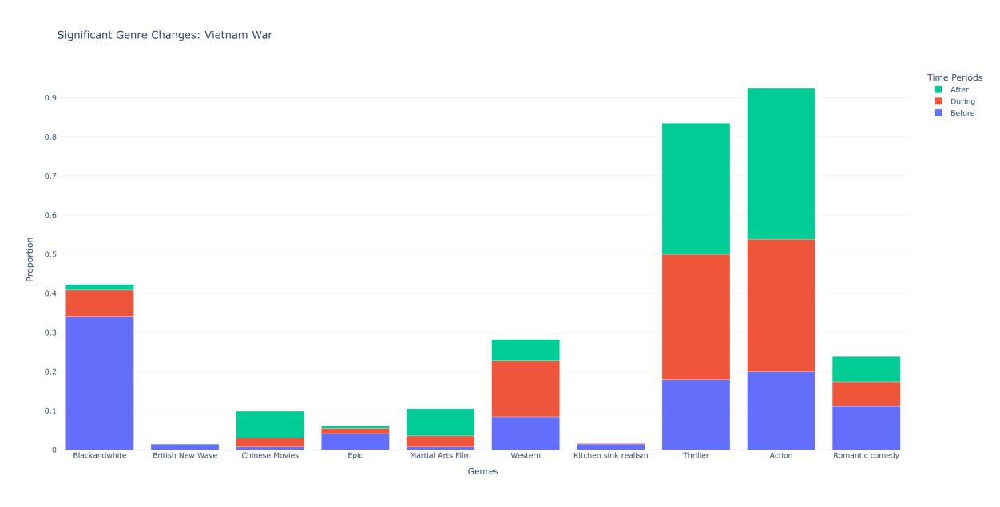

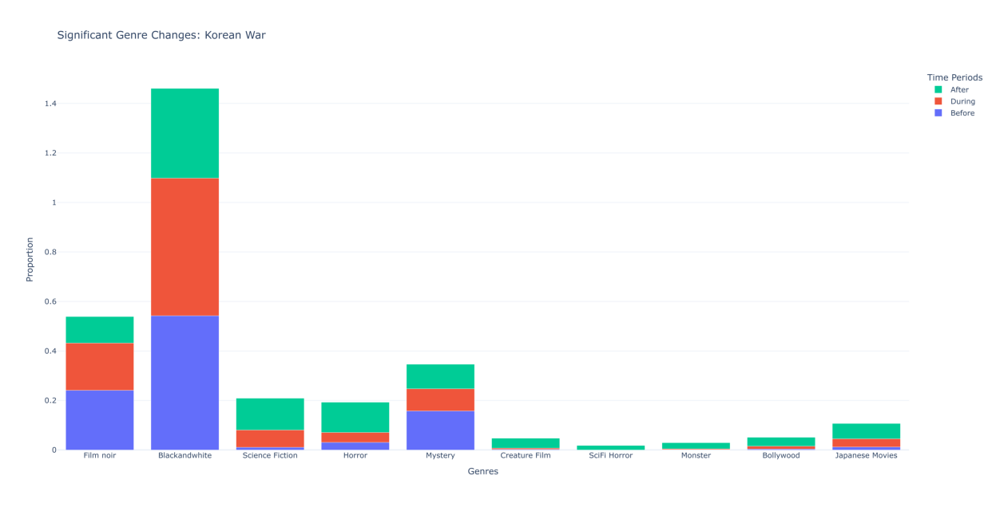

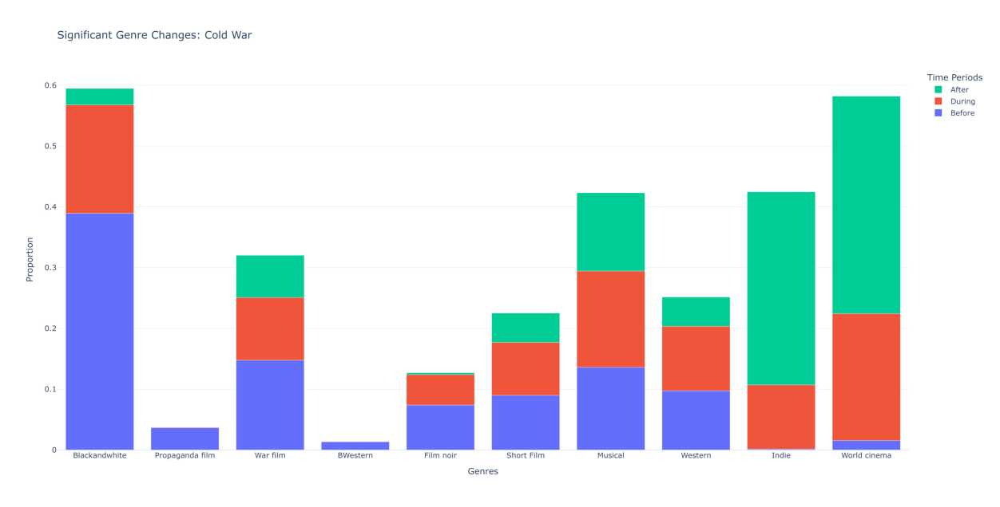

In [18]:
genre_shifts_analysis(df_movies,1939, 1945, "Second World", "significantchange_WW2", window=5)
genre_shifts_analysis(df_movies, 1980, 1988, "Iran-Iraq", "significantchange_Iran-Iraq", window=5)
genre_shifts_analysis(df_movies, 1965, 1975, "Vietnam", "significantchange_Vietnam", window=5)
genre_shifts_analysis(df_movies, 1950, 1953, "Korean", "significantchange_Korean",window=5)
genre_shifts_analysis(df_movies, 1947, 1991, "Cold", "significantchange_ColdWar", window=5)

Significant changes in genre distribution were defined for the chosen wars by using chi-square testing. The window before and after the war defined as 5 years.

World War II

Some of the changes can be associated with cinematography trends: Back and White, Film Noir, PreCode (Pre-Code Hollywood was an era in the American film industry that occurred between the widespread adoption of sound in film in the late 1920s), and World Cinema. However, it is important to note that the origins of Film Noir as a genre included dark themes and after the war the genre grew and started depicting moral ambiguity, physchological effects of war and other introspection and reflection on the war.

Some interesting observations here also incldue that the War Film genre increases greatly during the war but in the aftermath drops to its previous level. A similar thing happened to the Horror genre - moreover, its production after the war drops to lower than before the event. Thriller and Psychological Thriller, on the other hand exprience growth during and then after the war as well. The production of Drama drops during the war and increases back afterwards. Propaganda movies were on an extreme rise during the war, which aligns with the nature of the World War II and propagandistic goals of Nazi Germany.

Cold War

As discussed earlier, the Cold War spans a very large timeline, moreover the “before” time for it includes the World War II, so it is hard to make any concrete analysis from the resulting graph. Most of the changes are explained the trends in cinematography. We can say, however, that the War Films experienced a drop after the Cold War ended.

Vietnam War

Here we once again see an increase in Thriller movies production and here it is joined by Action movies. Interestingly, the War Film genre has not experienced significant changes, even though its peaks were identified to happen at the time as well. Romantic comedy genre has significantly decreased and noteably, for some timelines we have seen before a correlation - that Romantic comedy production decreases as the number of wars grows. It is interesting to see a great increase in Matrial Arts Film, which could be affected by the events of the war, as Martial Arts are usually associated with Asian culture. Genres like British New Wave and Kitchen Sink Realism (film, whose protagonists usually could be described as “angry young men” who were disillusioned with modern society) dropped in production. These genres talked about social issues but were weakly related to specific wars.

Iran-Iraq War

For the timeline of the Iran-Iraq, it seems like most of the significant genre production changes were influenced by trends in cinematography and new genres originating at the time. This could also be explained by the fact that this war included much less countries than the previous war and lacked the involvement of Western countries and the United States specifically who dominate the movie market.

Visualizing the genres for the chosen wars. Second Laotian was omitted in the final report due to its significant overlap with the Vietnam War in timelines.

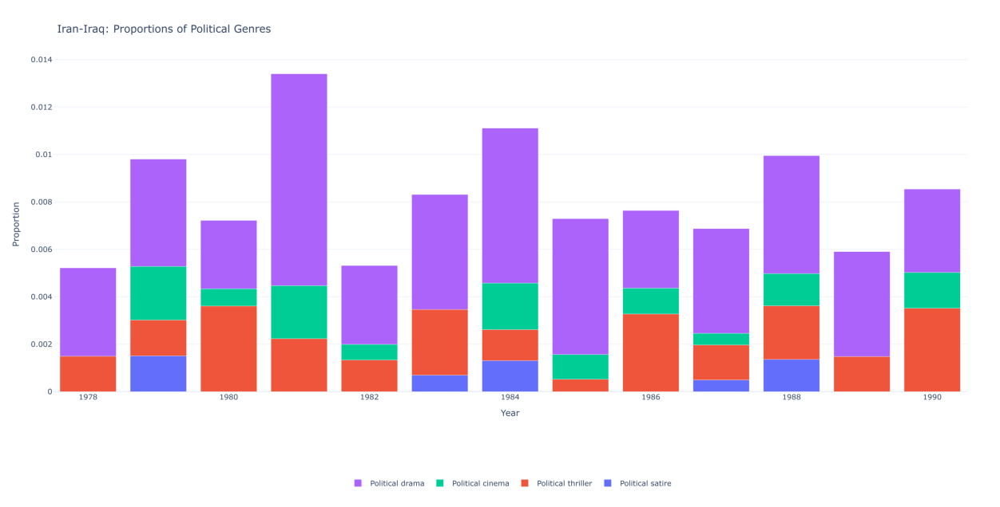

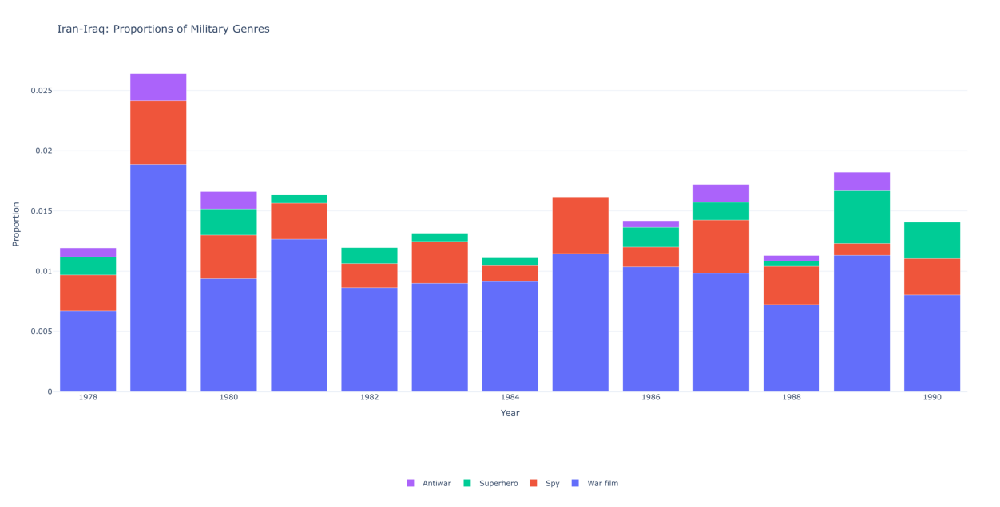

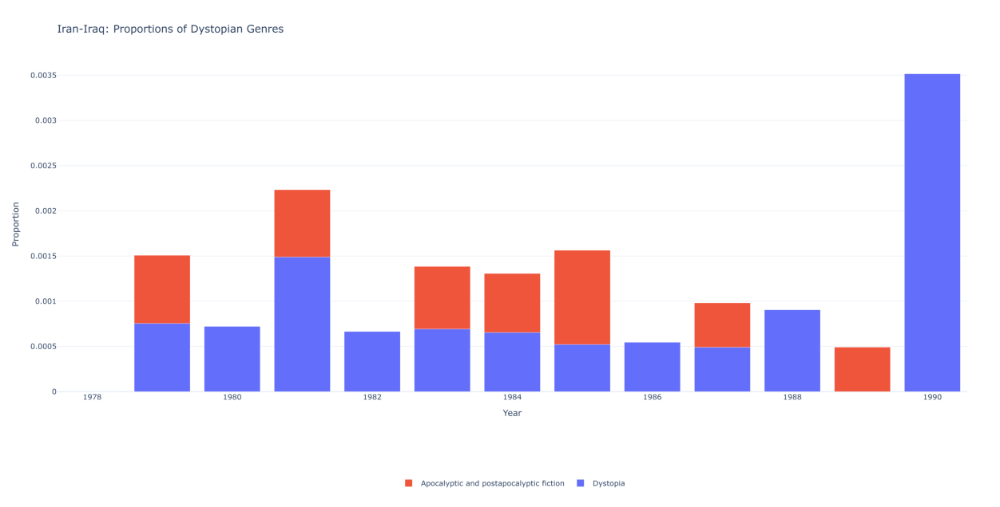

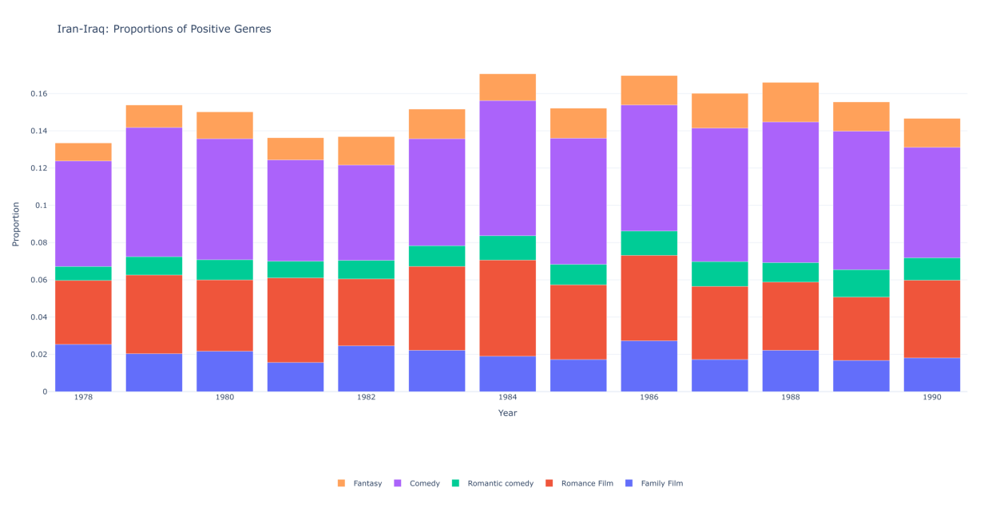

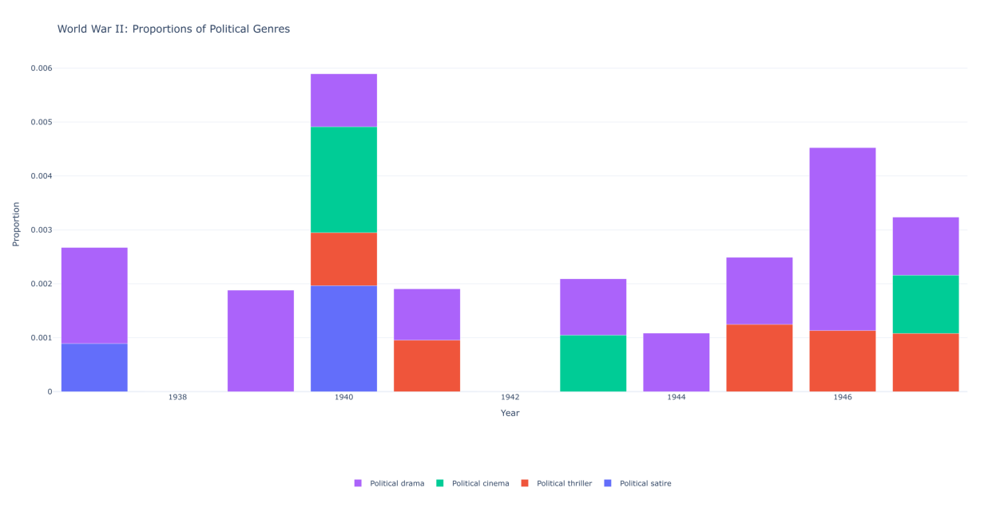

...

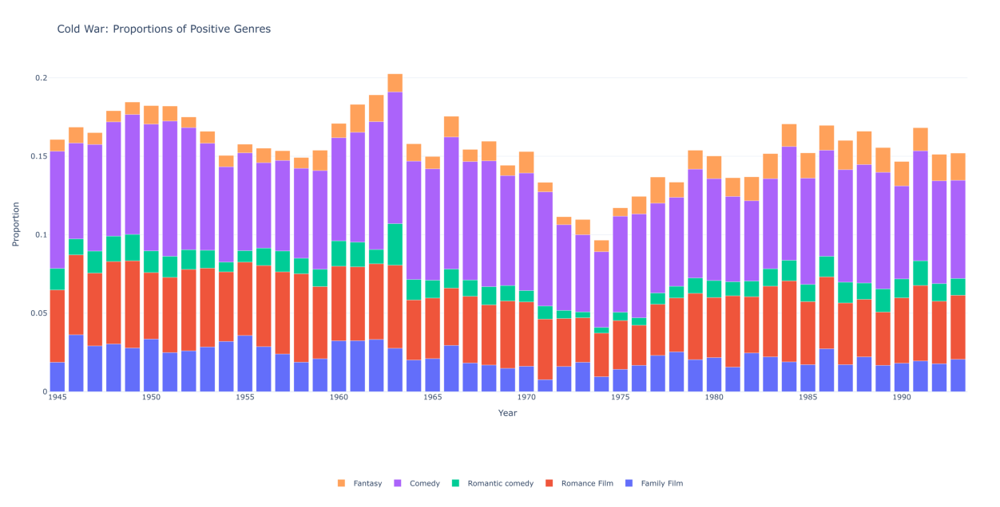

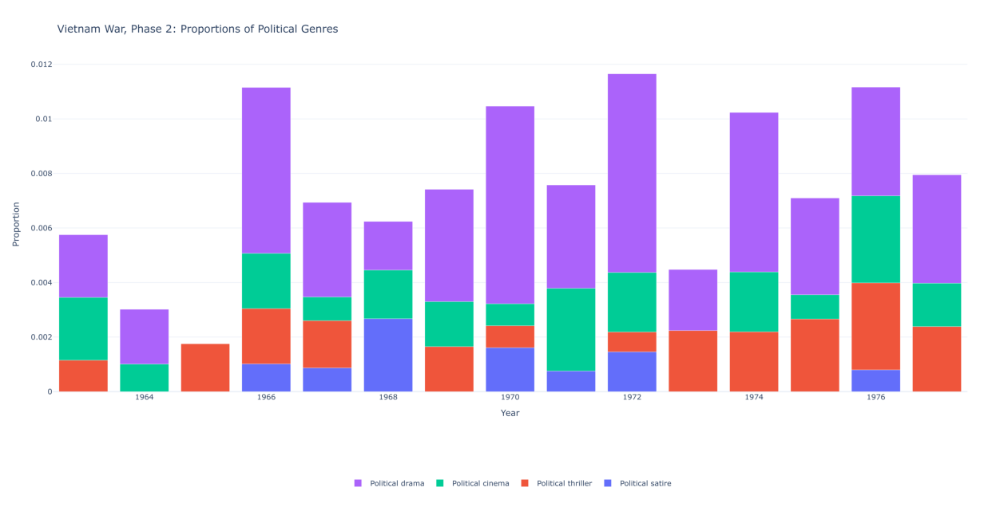

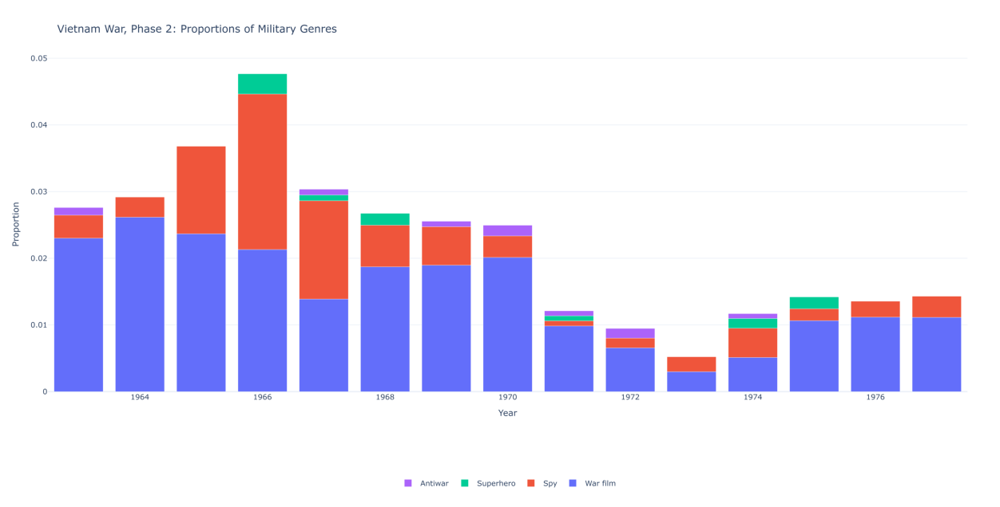

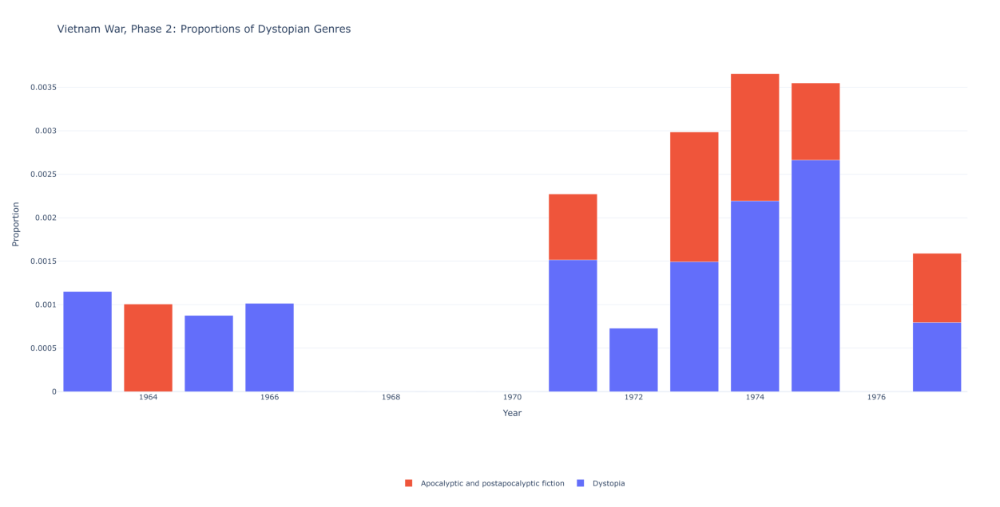

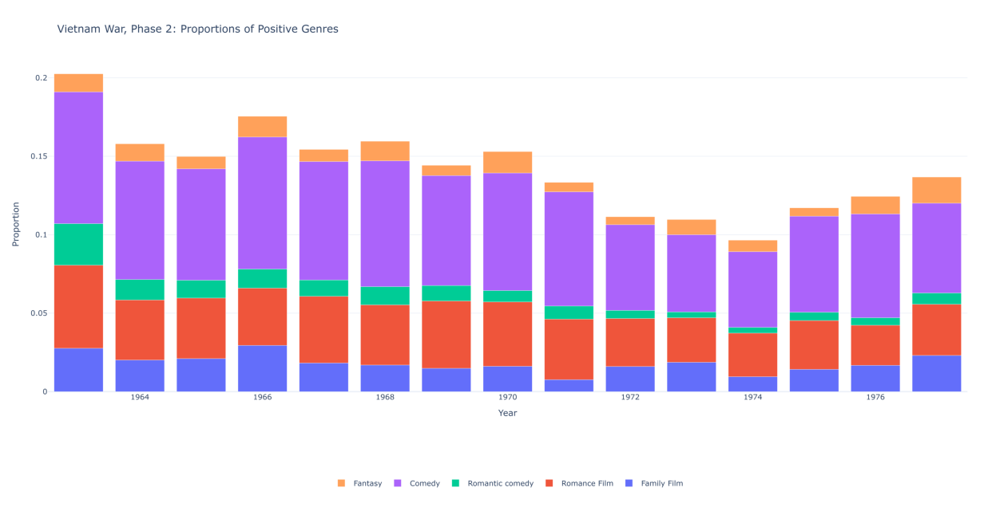

In [19]:
# Loop through all wars and generate plots
for i in range(len(chosen_wars)):
    start, end, war_name = pick_years(chosen_wars, i)
    war_analysis(df_movies, start, end, war_name)

World War II

Military Genres: For military mvoies we can see an almost normal distribution in the plot for World War II. The War Film genre especially looks like it follows normal distribution with its peak in 1943. The spy movies also were at the highest in the middle of the war (1942 and 1943).

Positive Genres: The positive genres seem to be quite stable over the timeline with a vary similar total proportion for each year.

Cold War

Military Genres: Multiple the events of signigicant importance within the Cold War happened in the 1950s and 1960s, which could explain some increase in the War Film genre. However, as we know, the Vietnam War also starts in the 1960s, so the results can be affected by both of these. Another rise closer to the 1980s, for example, could be associated with the war in Afghanistan, which is associated with the Cold War as well. However, these observartions are highly theoretical and could be a base for a more specific Cold War analysis in another study.

Positive Genres: Once again we see that the positive genre production is stable over time even for such a extensive timeline, except for a drop from around 1966, which will be mentioned later.

Vietnam War

Military Genres: From 1963 to 1971 it seems like the Spy genre is close to normal distribution, which could be related to the nature of the Vietnam War. It is important to note that the U.S. was involved in the Civil War and events in Vietnam before it officially joined it. The War Film genre was quite stable in the beginning and dropped in the middle.

Positive Genres: Interestingly, as mentoined earlier here the Positive Genres are not stable and they slowly decrease in produciton up until 1974, mostly due to the Comedy genre. Thus, it could be hypothesized that this war specifically had an unusual effect on the Comedy genre.

Iran-Iraq War

Military genres: The production of War Film had a noticeably peak in 1979 (note: Soviet invasion in Afghanistan) but stayed approximately the same for the other years. So we can assume the Iran-Iraq War did not affect the genre greatly.

Dystopian genres: There is definitely a noticeable increase in the genre of Dystopia in the 1990 but it is hard to tell if it influenced by cinematographic trends, the war or other events.

Positive Genres: The positive genres have stable production over time.

Most of the time the positive genres have the same proportion across the timeline with an exception of a Vietnam War or the 1960s and 1970s (included multiple political events within the Cold War such as Cuban Missile Crisis, Fall of the Berlin Wall, Prague Spring). We can conclude that positive events are usually stable in production and are not highly affected by wars. However, the found exception is an interesting observation that could be analysed further. The political genres do not lead to any conclusions and contain a lot of oscillations. The conclusion is that the political genres are not affected by interstate wars but could be affected by other global events. The dystopian genres also do not lead to any specific conclusion and do not seem to be influenced by wars. We can also note that these genres are quite modern and lack in produciton in the 20th century. The military genres often seemed to follow a normal distribution during the big 20th century wars. This implies that military-related genres rise as the war starts, peak in the middle of the war and decrease again. However, for Iran-Iraq War the pattern was not identified, which could be due to the involvement of Western Countries and the scale of the event.

## Question 2

This section of our research is devolved to the following research question:   
`How do movie genre preferences differ between countries in conflict or those experiencing similar global events?`   
in which we investigate variations in genre trends across nations, focusing on contrasts during political tensions and on how different nations respond to similar historical events.

### Imports

In [20]:
from src.utils.utils_movie import *
from src.utils.utils_wars import *
from src.utils.interactive_plots import *
import warnings
warnings.filterwarnings("ignore")

In [21]:
movies = load_data_movies(movies_path_base)
wars = load_data_wars(wars_path_base)

In [22]:
movies.head()

,Movie_ID,IMDb_Index,Title,Original_Title,Release_Date,Year,Genres,Genres_IMDb,Rating,Votes,Revenue,Length,Languages,Countries,summary
0,975900,tt0228333,Ghosts of Mars,Ghosts of Mars,2001-08-24,2001,"[Thriller, Science Fiction, Horror, Adventure,...","[Action, Horror, Sci-Fi]",4.9,58872,14010832.0,98.0,['English Language'],[United States of America],"Set in the second half of the 22nd century, th..."
1,261236,tt0083949,A Woman in Flames,Die flambierte Frau,1983,1983,[Drama],[Drama],5.9,648,NaN,106.0,['German Language'],[Germany],"Eva, an upper class housewife, becomes frustra..."
2,171005,tt0097499,Henry V,Henry V,1989-11-08,1989,"[Costume drama, War film, Epic, Period piece, ...","[Biography, Drama, History]",7.5,32088,10161099.0,137.0,['English Language'],[United Kingdom],{{Plot|dateAct 1Act 2Act 3Act 4Act 5 Finally n...
3,77856,tt0058331,Mary Poppins,Mary Poppins,1964-08-27,1964,"[ChildrensFamily, Musical, Fantasy, Comedy, Dr...","[Comedy, Family, Fantasy]",7.8,189202,102272727.0,139.0,['English Language'],[United States of America],The film opens with Mary Poppins perched in a...
4,32456683,tt0061637,Die Fahne von Kriwoj Rog,Die Fahne von Kriwoj Rog,1967,1967,[],[Drama],7.7,24,NaN,108.0,['German Language'],[German Democratic Republic],"Otto Brosowski, a communist miner, writes to t..."


In [23]:
wars.drop(columns=["BatDeath", "Outcome"], inplace=True)
wars.head()

,StateName,Side,StartYear,EndYear,WhereFought,Movies
WarName,,,,,,
Second Sino-Japanese,Japan,1,1931,1933,7,931
Second Sino-Japanese,China,2,1931,1933,7,931
Chaco,Bolivia,2,1932,1935,1,1198
Chaco,Paraguay,1,1932,1935,1,1198
Saudi-Yemeni,Saudi Arabia,1,1934,1934,6,806


In [24]:
conflicts_to_check = []
war_names = list(set(sorted(wars.index)))
for war in war_names:
    print(war)
    war_data = wars[wars.index==war]
    side_1, side_2 = find_sides(war_data)
    start_year, end_year = find_years(war_data)
    movies_war = find_movies_year(movies, start_year, end_year)
    movies_war_1 = find_movies_side(movies_war, side_1)
    movies_war_2 = find_movies_side(movies_war, side_2)
    if movies_war_1 is not None and movies_war_2 is not None:
        conflicts_to_check.append(war)
print(f"The conflicts to check are {conflicts_to_check}")

First Kashmir
Kargil War
Taiwan Straits
Gaza-Israel conflict
World War II
Ugandian-Tanzanian
Falkland Islands
Franco-Thai
Changkufeng
Invasion of Iraq
Russo-Georgian War
Football War
Sino-Vietnamese Border War
Korean
Off-shore Islands
Arab-Israeli
Vietnamese-Cambodian
Second Ogaden War, Phase 2
Azeri-Armenian
Saudi-Yemeni
Second Laotian, Phase 2
War of Attrition
Cenepa Valley
War over Lebanon
Cold War
Second Kashmir
Bosnian Independence
Soviet Invasion of Hungary
Badme Border
Nomonhan
Sino-Vietnamese Punitive
War over the Aouzou Strip
Bangladesh
Assam
Communist Coalition
IfniWar
War over Angola
Yom Kippur War
Sinai War
Six Day War
Turco-Cypriot
Vietnam War, Phase 2
Heglig Crisis
Iran-Iraq
Russo-Finnish
First Libyan Civil War
Gulf War
Invasion of Afghanistan
Third Sino-Japanese
Chaco
Conquest of Ethiopia
War for Kosovo
Second Sino-Japanese
The conflicts to check are ['Kargil War', 'World War II', 'Invasion of Iraq', 'Russo-Georgian War', 'Sino-Vietnamese Border War', 'Korean', 'Second L

Out of the list of conflicts obtained this way, we will focus our analysis on a subset of them, made of the ones with the highest historical importance and the highest amount of data in the dataset.   
The 4 conflicts we will focus on will be `Cold War`, `Korean War`, `Vietnam War` and `World War II`.

### Geographical Illustration

In this section we give a quick overview of the analyzed conflicts, by showing for each country a world map showing the countries on each side of the conflict. This distinction between `Side 1` (Red) and `Side 2` (Blue) will be important for a deeper understanding of the following sections.

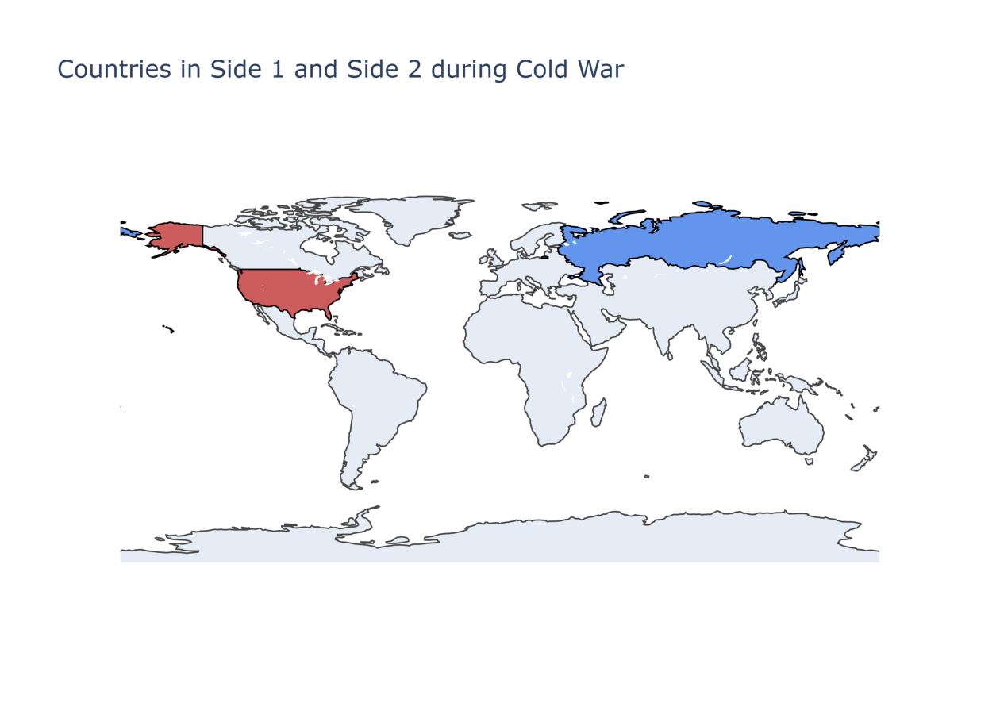

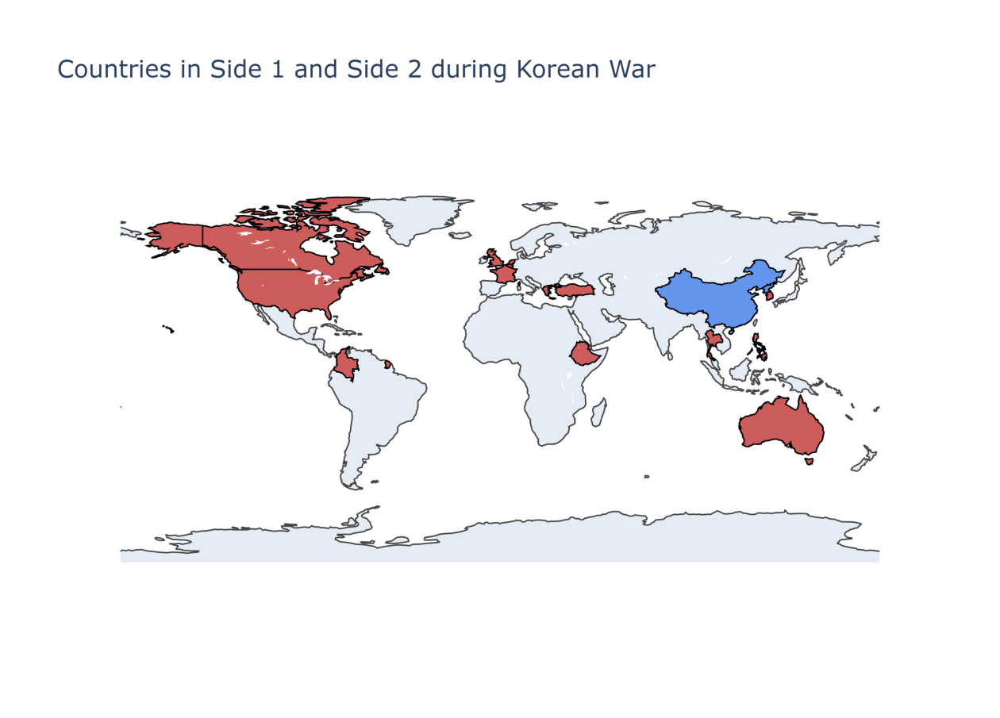

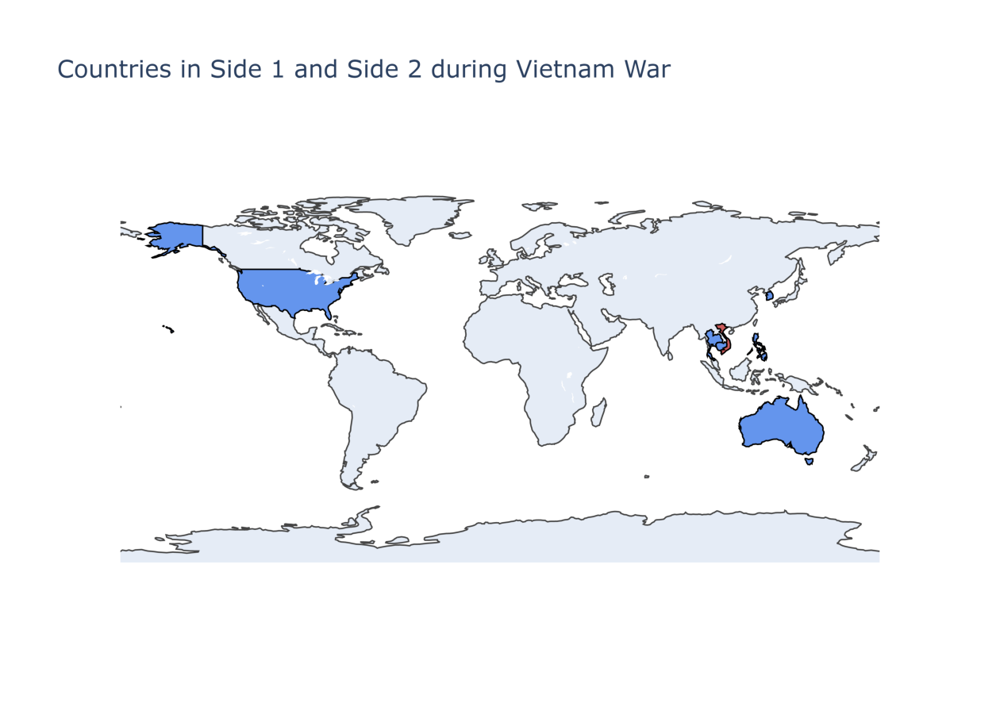

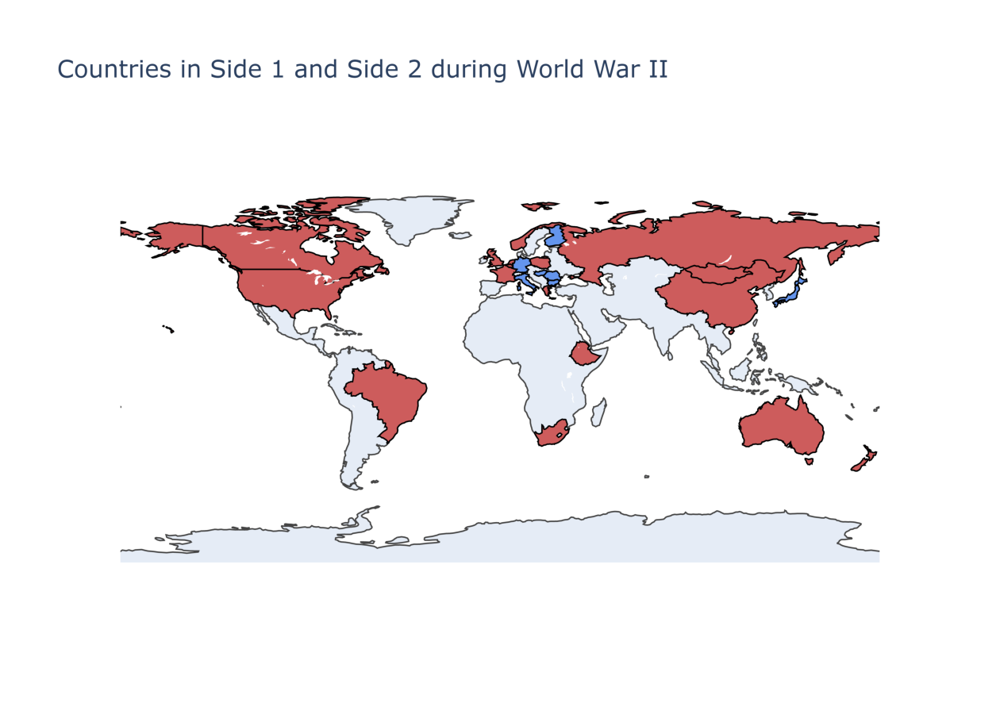

In [25]:
war_names_r = ["Cold War", "Korean", "Vietnam War, Phase 2", "World War II"]
for war in war_names_r:
    side_1, side_2 = find_sides(wars[wars.index==war])
    plot_countries(side_1, side_2, war)

### Timeline Illustration

Another plot helpful in the understanding of the setting of the analysis is the following timeline, which aims to show the number of movies produced over the course of the years relative to each one of the considered conflicts. To obtain the plot, we filter the dataset based on the `summary` column, looking for the name of the conflict (or abbreviations, such as WW2):

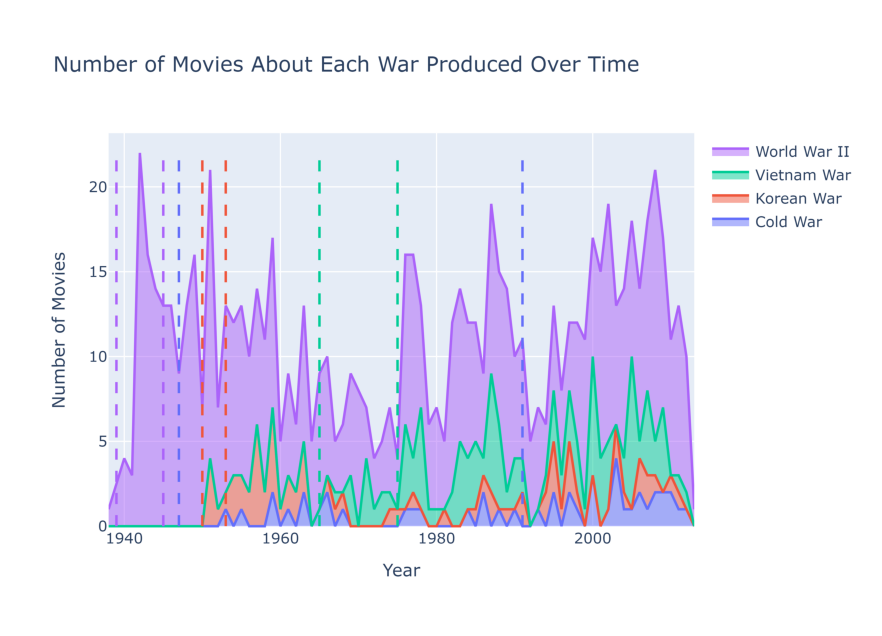

In [26]:
plot_movies_timeline(wars, movies, war_names_r, True)

The plot shows a large area associated to movies related to `World War II`, much larger than that of all other conflicts combined. This highlights the influence a conflict of such scale has had on the world even further in the future.   
A more in-depth inspection of the graph shows how, despite the general movies trend are characterized by an overall increase in movies produced every year, the peak in production of WWII movies has peaked during the conflict itself, to then decrease gradually over time to then settle between 10-15 movies a year in the XXI century.   
Movies on the `Vietnam War` were not produced inconsistently across all years starting from the war, reaching their peak in 2005 with 9 movies.   
The `Korean War` has had its highest movies production in the period right after the war, in the 1950s, after which it hasn-t received much attention in the cinematographic world, achieving at most 3 movies per year ever since.   
Finally, contrary to our expectations, the `Cold War` itself didn't get much attention during the course of the years, with no more than 4 movies produced in a given year making it the lowest in our analysis.

### Quantitative Analysis

The final introductive plot of this section is a sunburst chart which depicts for each war where the movies obtained by the previous filtering are produced, using the same division between `Side 1` and `Side 2` as in the section for `Geographical Illustration`.   
This section is mainly aimed at depicting a comparison between the way the opposing countries in the war (as well as the ones not directly involved) were influenced by the conflicts, in terms of a purely quantitative rather than qualitative analysis.   
For each of the following plots, the `Red` section corresponds to `Side 1`, the `Blue` one to `Side 2` and the `Green` one to movies produced in `other countries`.

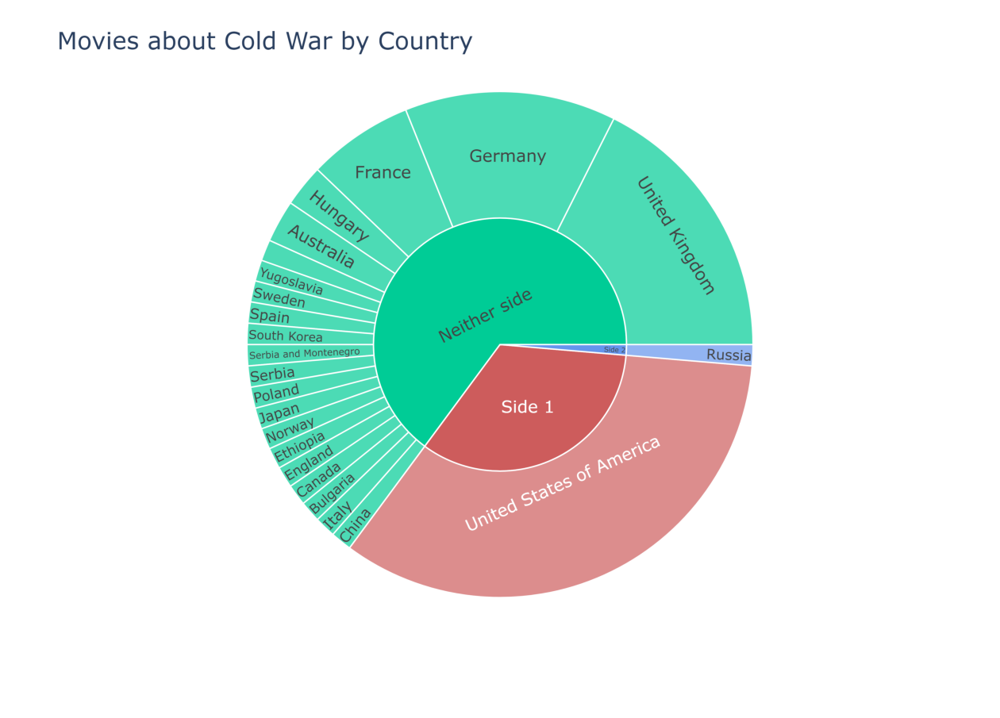

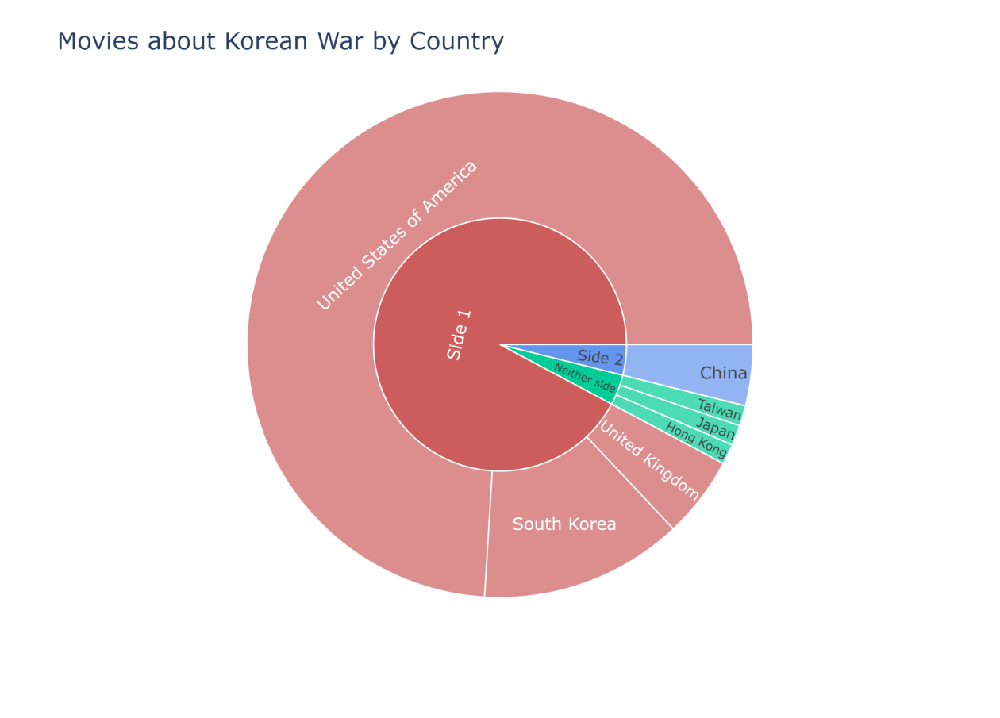

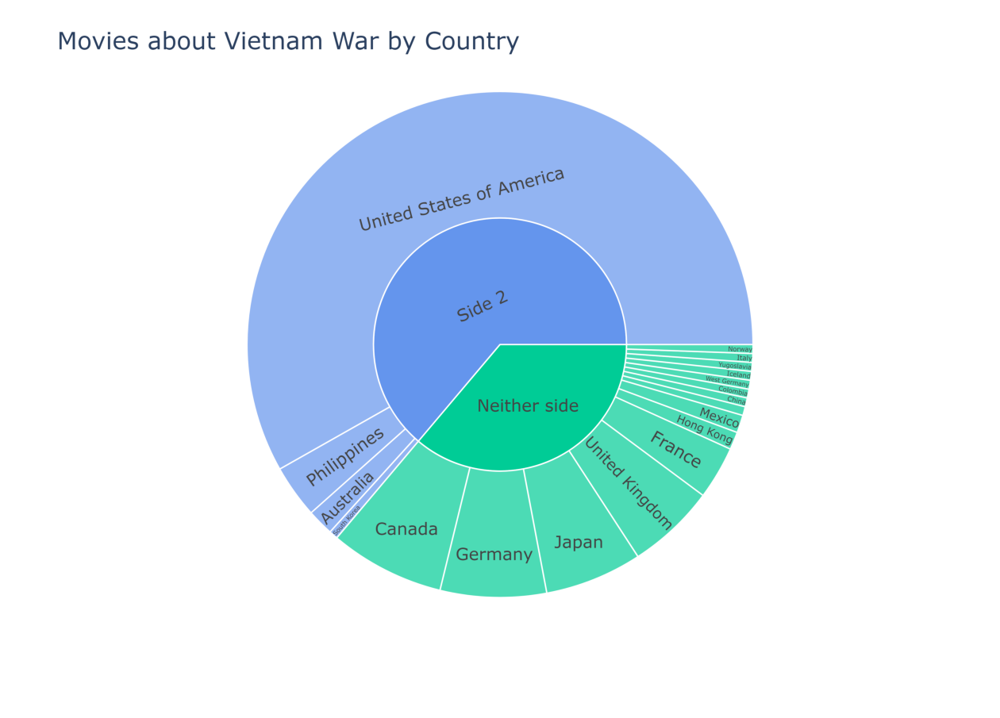

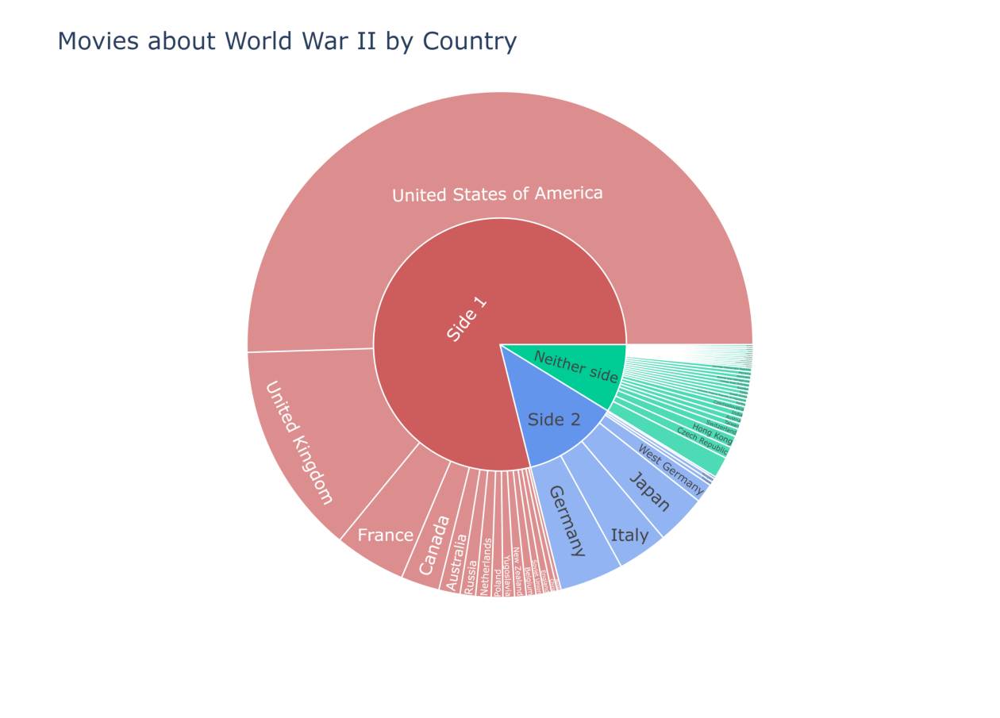

In [27]:
for war in war_names_r:
    plot_country_piechart(wars, movies, war)

A comment which can be made for each of these graphs is that United States take up the largest slice of the chart divided by countries, and this is largely due to the fact that the United States contribute in the largest amount to all movies produced, regardless of the topic.   

Entering more in detail, we see that for the `Cold War` the largest part of the movies were produced by countries not directly involved in the conflict, showing how such a conflict has impacted the whole world and not only the two opposing sides. As stated before, the USA contribute to the largest part of the movies, while Russia, despite being one of the two involved countries, only amounts to a single movie in our chart, surpassed by the large european countries such as Germany, UK and France.

Once again, for the `Korean War`, most of the movies were produced by the USA, but if we exclude its contribution we can see that South Korea, one of the countries directly involved in the conflict, is the largest producer of movies on the conflict. Follow the UK and China, alongside some other Asian countries.

For the `Vietnam War` we can see from the chart that no movies about it were released in Vietnam, only country directly involved in the war as "Side 2" in our dataset, while the movies are almost equally distributed among the various countries (as usual, exception made for the USA).

Finally, regarding `World War II`, we can see that the largest forces of the conflict lead the movie production, with the USA having released more than 400 movies, the UK more than 100 and countries such as France, Germany, Italy and Japan all with more than 20 movies each.
On top of this, the massive influence of the conflict can also be seen from the large number of smaller countries having released some movies about it, with movies released in more than 50 countries in total!

### Movie Genres by Depicted Country

In this and the following sections we delve deeper in the qualitative analysis and comparison between the two sides of the conflicts, analyzing the different distribution in movie genres for different subsets of the Movies dataset.   
Here we provide a first analysis by filtering our dataset based on the movies released in a historical period around each of the analyzed war, and check what is the movie genre of the movies depicting countries from either side of the conflict.   
To do this we first filter the dataset for movies released in a period of time of 2 years around the conflict by looking at the `Year` column, after which we filter the dataset once again based on the `Summary` column, but this time we look for movies mentioning the countries on either side (an alternative approach would be to look for movies released in such countries in this same timeframe, but this ends up reducing the dataset size too much and not providing enough data for any result).   
We plot our results in two barplots, one for each side of the war, each one showing not only the genre distribution for that period of time but also the genre distribution over the whole dataset, to provide through comparison additional information about the way this sentiment changed overtime.   

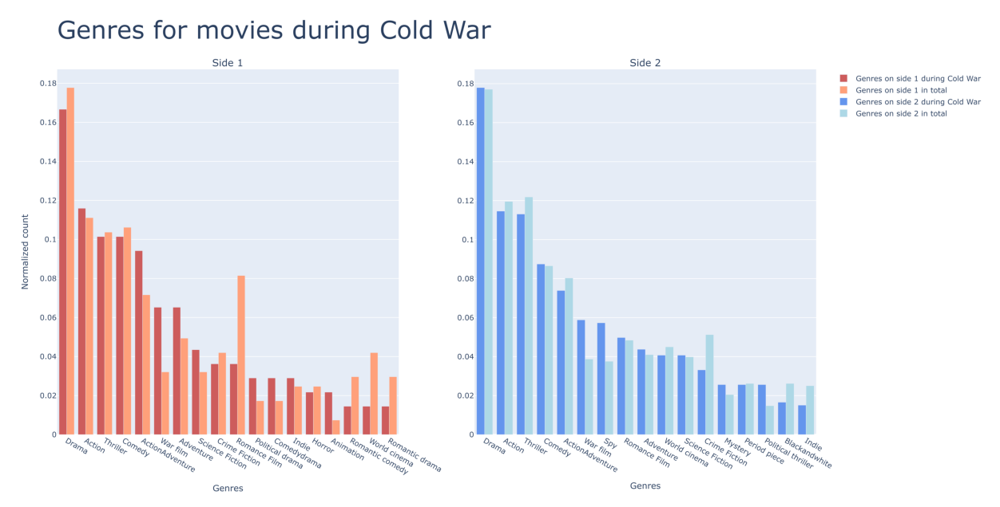

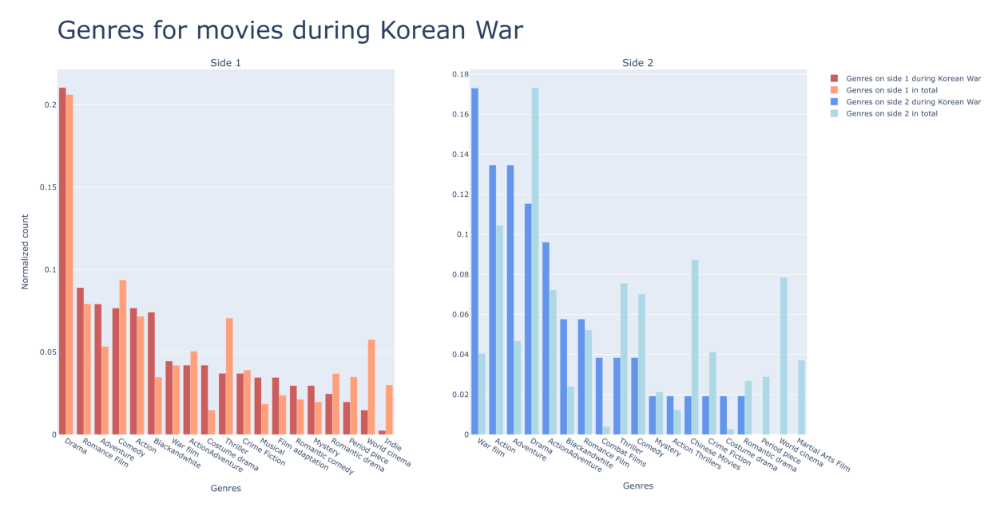

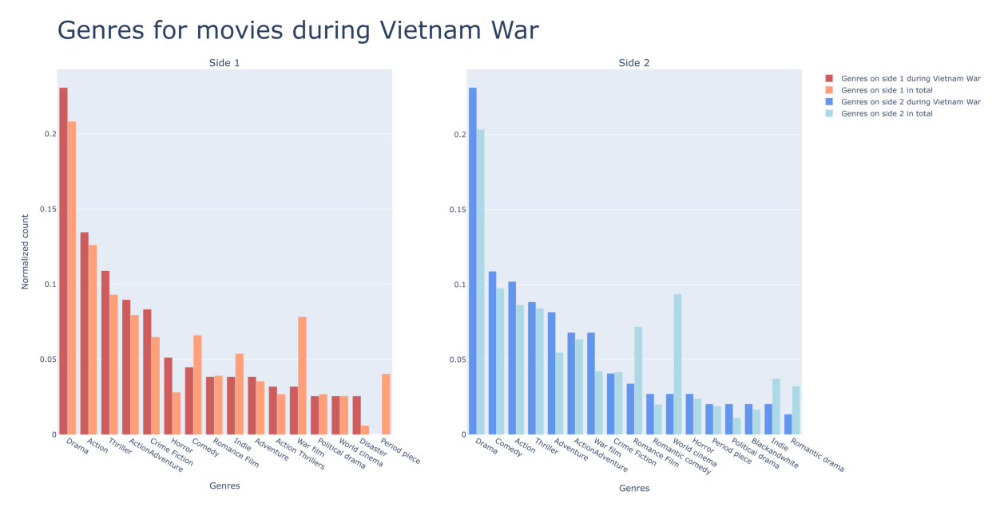

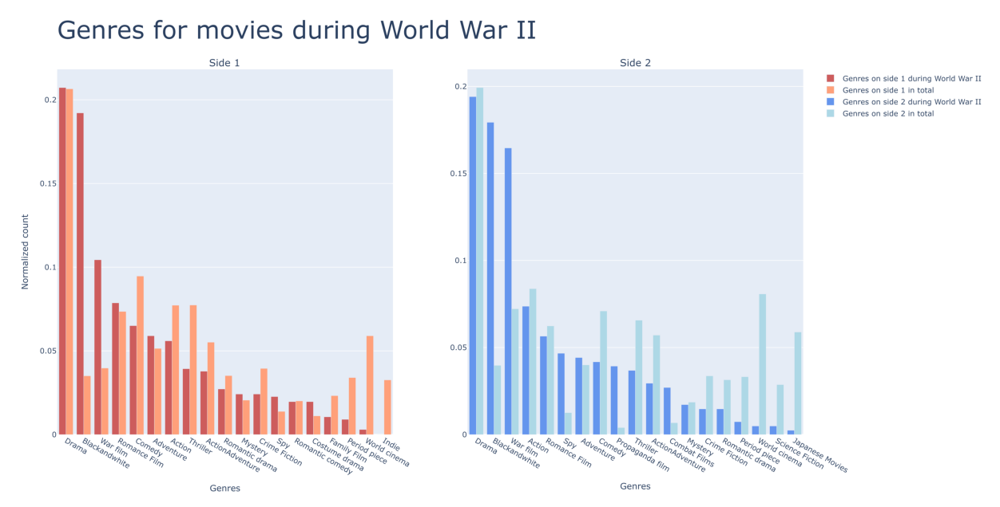

In [28]:
for war in war_names_r:
    plot_genres_year_side(*get_genres_year_side(wars, movies, war, mode="summary"))
    # plot_genres_year_side(*get_genres_year_side(wars, movies, war, mode="country"))

A first look at the plot makes it easy to see that genres like `Drama` are the most common overall, wo we will not consider these common trends in the analysis, but we will focus more on the distinctions between the two sides and between the specific time period vs the entire dataset.

During the `Cold War`, on Side 1 genres like Adventure, ActionAdventure, and War Films show a significant increase compared to the whole dataset, while genres related to romance are less common in this period of time. On Side 2, instead, Spy films and War films stood out more, alongside Political Thrillers, suggesting themes of espionage and historical reflection, themes fairly common in the sentiment of the time. 

During the `Korean War`, a common trend between the two sides was the large presence of BlackandWhite movies, which is mainly to attribute to an historical reason rather than a Geopolitical one. On Side 1, there was a strong emphasis on Romance Films and Adventure films, while Side 2 leaned more into violent themes, such as War Films (which are the most present in this reduced dataset) and Combat Films, highlighting themes of conflict and cultural representation.

The `Vietnam War` era saw a general increase in genres like Action, Thriller, and War Films, emphasizing the conflict's intensity, but the specific response of the two sides was quite different: Side 1 had a much stronger increase in genres like Crime Fiction, Horror and Disaster compared to all other subsets of data analyzed so far, underlying the climate of tension in Vietnam in particular in this period of time. Side 2, on the other hand, had changes more in line with the general trends, with Action, Adventure and War films being more present while Romance and World cinema are less common overall.

Finally, during `World War II`, we see once again the trend for  BlackandWhite films dominating the genre landscape on both sides compared to the overall dataset, once again associated to the analyzed historical period. What characeterizes this period the most is the sharp increase in War Films, which see by far the largest increase, with Spy movies being also fairly common on both sides. On top of this, genres like Adventure and Romance Films were still prominent, reflecting themes of heroism and human struggle. 
The most distinctive trend betwee the two sides is the presence of Propaganda Films on Side 2, alongside genres like Japanese Movies which are instead causes by a purely geographical connotation.

### Movie Genres by Country of Production

This final section of the comparative analysis between countries focuses more on the way the conflict is portrayed in movies produced in different countries. This section applies the same filtering as the one on `Quantitative Analysis`, but goes in depth analyzing the differences in genre between the two movie subsets, although this analysis often times ended up being difficult due to the limited sizes of the sub-datasets.

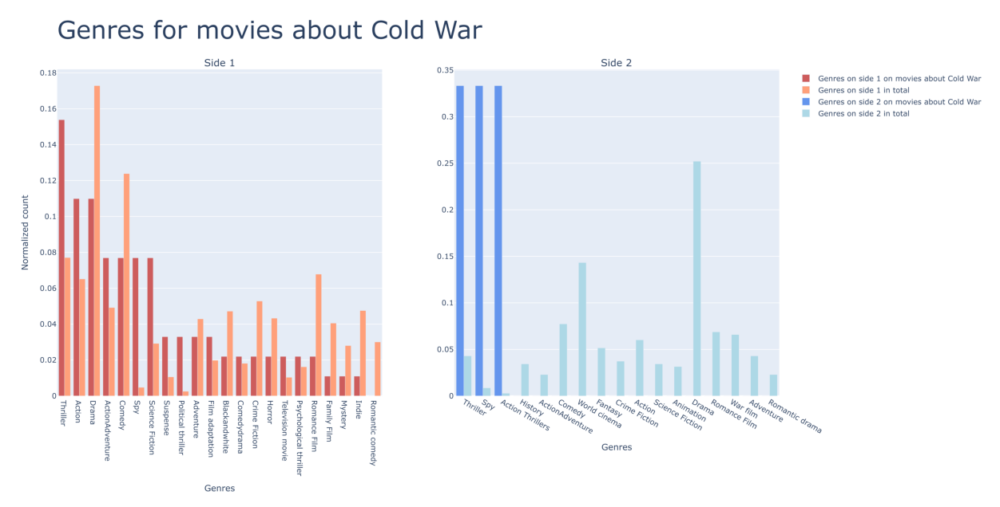

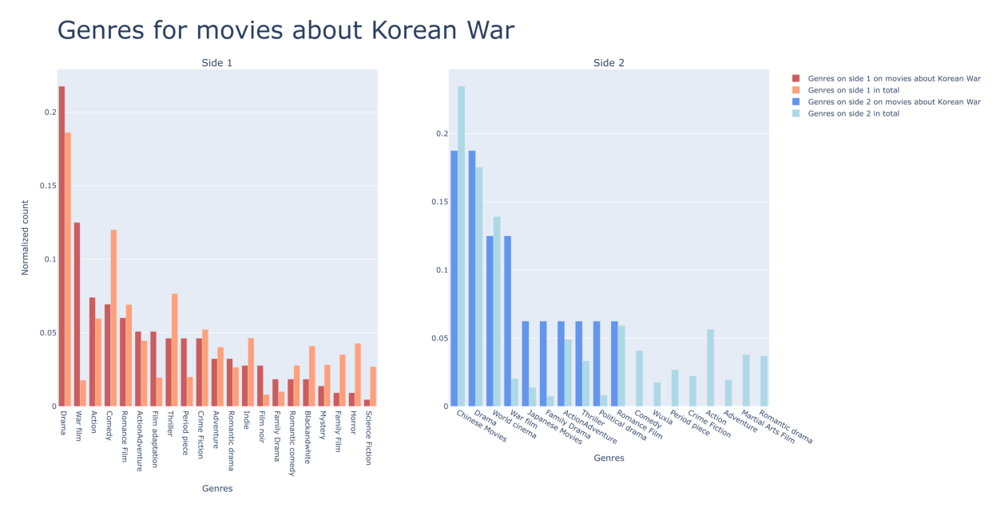

Not Enough Data


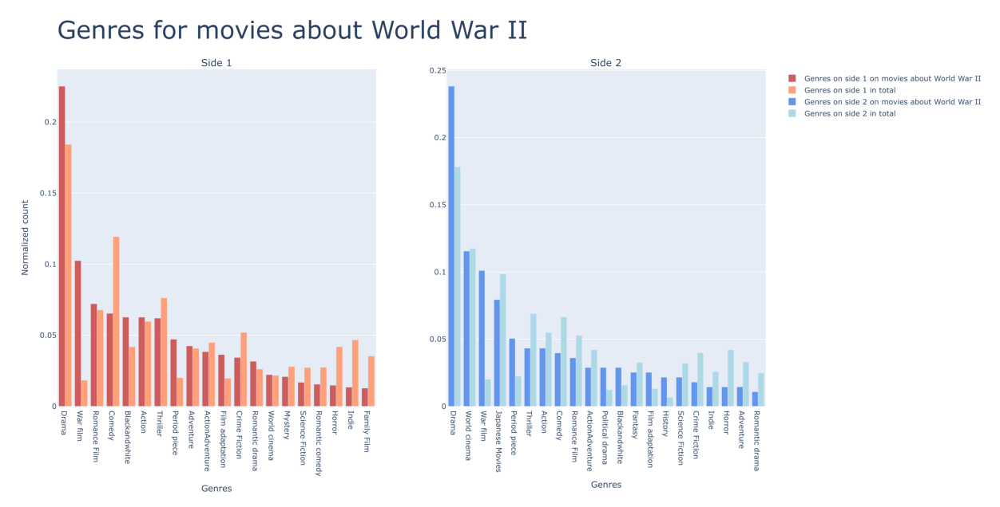

In [29]:
for war in war_names_r:
    plot_genres_summary_side(*get_genres_summary_side(wars, movies, war, mode="country"))
    # plot_genres_summary_side(*get_genres_summary_side(wars, movies, war, mode="summary"))

As stated in the introduction to this section, the fisrt thing  to notice is the fact that for both `Cold War` and `Korean War` one side has much fewer movies compared to the other, while for the `Vietnam War` not enough movies were found for one of the two sides, hence no plot was produced. This leads to a the results relative to these plots less significant overall, but we decided to still mention them for completeness.

The plot for the `Cold War` shows lines of regular heigths in the histogram, due to the small amount of movies plotted. Other than this, the trends in the plot are to be expected, with genres like Thriller and Spy being the most represented in both sides, but a weird-to-explain entry is the presence of Comedy films on Side 1.   
Movies about the `Korean War` show much more different genres on Side 1, while on Side 2 we see a strong geographical component in the genres, with Chinese and Japanese Movies being common.   
Finally, movies about `World War II` are the ones associated with the largest number of movies, information which can also be extracted by the "smoothness" of the histogram distribution. Both sides share a large variety of genres for the movies, with War films and Period Piece being the most significant ones in terms of comparison with the whole dataset, but no significant difference between the two sides can be extracted from he plot.

In general this plots underline how the general sentiment associated to the movies produced during the war and movies which directly reference the war are usually quite serious and tense, so we decided to go more in depth with the analysis of the sentiment of the storytelling, suing techniques derived from Natural Language Processing (NLP).

## Question 3

While our previous analysis revealed distinct patterns in genre production across different countries, a deeper examination of narrative construction within the same genre warrants investigation. Specifically, this section explores how war films, despite sharing a common genre classification, exhibit significant variations in their storytelling approaches based on their country of origin.

Our analysis will focus exclusively on war cinema as it provides a unique window into how different nations process, interpret, and memorialize shared historical events through film. War movies are particularly revealing because they often reflect not only a country's historical perspective but also its contemporary values, national identity, and relationship with military conflict

#### Imports 

In [30]:
import pandas as pd
import numpy as np
from src.utils.sentiment_analysis import *
import plotly.express as px
import seaborn as sns
import warnings
import re
import nltk
from nltk.tokenize import word_tokenize, sent_tokenize
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from nltk import ne_chunk
from nltk.sentiment import SentimentIntensityAnalyzer
from ast import literal_eval
import plotly.graph_objects as go 
import plotly.io as pio
from IPython.display import Image
from plotly.subplots import make_subplots
import warnings
from scipy import stats
warnings.filterwarnings("ignore")

In [31]:
# Download necessary NLTK packages for text processing and sentiment analysis
nltk.download('punkt')  # Tokenizer for splitting text into words
nltk.download('averaged_perceptron_tagger')  # POS tagger for grammatical structure
nltk.download('maxent_ne_chunker')  # NER chunker for extracting named entities
nltk.download('words')  # Word corpus for NER
nltk.download('stopwords')  # Common words to exclude from analysis
nltk.download('wordnet')  # Lexical database for English
nltk.download('vader_lexicon')  # Lexicon for sentiment analysis
nltk.download('omw-1.4')

# Define the set of English stopwords to remove common words that don't add meaning
stop_words = set(stopwords.words("english"))

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\fatum\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     C:\Users\fatum\AppData\Roaming\nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!
[nltk_data] Downloading package maxent_ne_chunker to
[nltk_data]     C:\Users\fatum\AppData\Roaming\nltk_data...
[nltk_data]   Package maxent_ne_chunker is already up-to-date!
[nltk_data] Downloading package words to
[nltk_data]     C:\Users\fatum\AppData\Roaming\nltk_data...
[nltk_data]   Package words is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\fatum\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\fatum\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-

In [32]:
# Loading data 
df = pd.read_csv('data/movies_with_summaries.csv')
wars_df = pd.read_csv('data/wars_filtered_clean.csv')
lemmatizer = WordNetLemmatizer()

In [33]:
# Extracting sides
wwii_movies_side1, wwii_movies_side2, cold_war_movies_side1, cold_war_movies_side2, korean_war_movies_side1, korean_war_movies_side2, vietnam_war_movies_side1, vietnam_war_movies_side2 = extracting_side(wars_df, df)



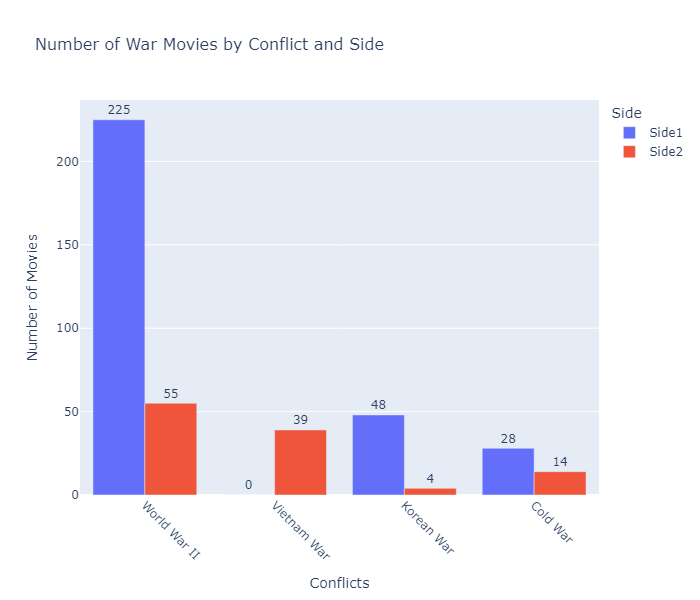

In [34]:

# Number of movies per sides

data = {
    'Wars': ['World War II', 'Vietnam War', 'Korean War', 'Cold War'],
    'Side1': [
        wwii_movies_side1.shape[0], 
        vietnam_war_movies_side1.shape[0], 
        korean_war_movies_side1.shape[0], 
        cold_war_movies_side1.shape[0]
    ],
    'Side2': [
        wwii_movies_side2.shape[0], 
        vietnam_war_movies_side2.shape[0], 
        korean_war_movies_side2.shape[0], 
        cold_war_movies_side2.shape[0]
    ]
}

df_visual = pd.DataFrame(data)

# Melt the dataframe for a grouped bar chart
df_melted = df_visual.melt(id_vars="Wars", var_name="Side", value_name="Number of Movies")

# Create the interactive bar chart with plotly express
fig = px.bar(
    df_melted, 
    x="Wars", 
    y="Number of Movies", 
    color="Side", 
    barmode="group",
    text="Number of Movies",
    title="Number of War Movies by Conflict and Side"
)

fig.update_layout(
    xaxis_title="Conflicts",
    yaxis_title="Number of Movies",
    title_font_size=16,
    xaxis_tickangle=45,
    legend_title="Side",
    font=dict(size=12),
    height=600
)


fig.update_traces(textposition="outside")
fig.write_html("number_of_war_movies.html")
fig.write_image("number_of_war_movies.png")
Image('number_of_war_movies.png')


Given the limited number of movies produced about the Vietnam War and the Korean War, we have decided to focus exclusively on the Cold War and World War II.

# Sentiment Analysis

We will perform a sentiment analysis on the summaries of movies identified. To achieve this, we will use the NLTK (Natural Language Toolkit) library. This analysis will help identify the emotional tone of the summaries, determining whether they are primarily positive, negative, or neutral depending of the countries of production.


In [35]:
## Preprocess the summaries: tokenize and clean the text and Remove stopwords

processed_docs_1 = preprocess_summaries(wwii_movies_side1, stop_words, column_name="summary")
processed_docs_2 = preprocess_summaries(wwii_movies_side2, stop_words, column_name="summary")
processed_docs_3 = preprocess_summaries(cold_war_movies_side1, stop_words, column_name="summary")
processed_docs_4 = preprocess_summaries(cold_war_movies_side2, stop_words, column_name="summary")

NameError: name 'preprocess_summaries' is not defined

In [7]:
## Conduct the Sentiment Analysis

sentiment_df_1=conduct_sentiment_analysis(processed_docs_1, wwii_movies_side1)
sentiment_df_2=conduct_sentiment_analysis(processed_docs_2, wwii_movies_side2)
sentiment_df_3=conduct_sentiment_analysis(processed_docs_3, cold_war_movies_side1)
sentiment_df_4=conduct_sentiment_analysis(processed_docs_4, cold_war_movies_side2)

In [28]:
## Calculte the meand and the IC of the Sentiment Analysis

mean_scores_1 = sentiment_df_1.mean()
mean_scores_2 = sentiment_df_2.mean()
mean_scores_3 = sentiment_df_3.mean()
mean_scores_4 = sentiment_df_4.mean()

ci_wwii_side1 = calculate_confidence_intervals(sentiment_df_1)
ci_wwii_side2 = calculate_confidence_intervals(sentiment_df_2)
ci_cold_side1 = calculate_confidence_intervals(sentiment_df_3)
ci_cold_side2 = calculate_confidence_intervals(sentiment_df_4)



NameError: name 'sentiment_df_1' is not defined

In [29]:
#WWII VISUALISATION

# Visualisation 1 : mean compearison
labels = ['Negative', 'Neutral', 'Positive', 'Compound']
x = np.arange(len(labels))

#Confiance Intervall

ci_lower_1 = mean_scores_1 - ci_wwii_side1['ci_lower'].values
ci_upper_1 = ci_wwii_side1['ci_upper'].values - mean_scores_1

ci_lower_2 = mean_scores_2 - ci_wwii_side2['ci_lower'].values
ci_upper_2 = ci_wwii_side2['ci_upper'].values - mean_scores_2


fig1 = go.Figure()
fig1.add_trace(go.Bar(
    x=labels,
    y=mean_scores_1,
    name='Side 1',
    error_y=dict(
        type='data',
        symmetric=False,
        array=ci_upper_1,
        arrayminus=ci_lower_1
    ),
    marker_color='blue',
    opacity=0.7
))
fig1.add_trace(go.Bar(
    x=labels,
    y=mean_scores_2,
    name='Side 2',
    error_y=dict(
        type='data',
        symmetric=False,
        array=ci_upper_2,
        arrayminus=ci_lower_2
    ),
    marker_color='orange',
    opacity=0.7
))

fig1.update_layout(
    title="Comparison of Mean Sentiment Scores for WWII",
    xaxis_title="Sentiment",
    yaxis_title="Mean Sentiment Score",
    barmode='group',
    legend_title="Sides", 
    height = 500,
    autosize=True,
    yaxis=dict(
        tick0=0,
        dtick=0.1, 
        scaleratio=2
    )
)

fig1.write_html("wwii_sentiment_mini.html")
fig1.write_image("wwii_sentiment_mini.png")
Image('wwii_sentiment_mini.png')

NameError: name 'mean_scores_1' is not defined

We do observe a higher negative score which isn't surprizing, however the overlapping confidence intervals across all categories indicate that the differences between the Allied and Axis films' sentiment scores are likely not statistically significant. However, it is surpriing to observe that the confidence intervall is much higher for the compound result. Let's observe the distribution. 

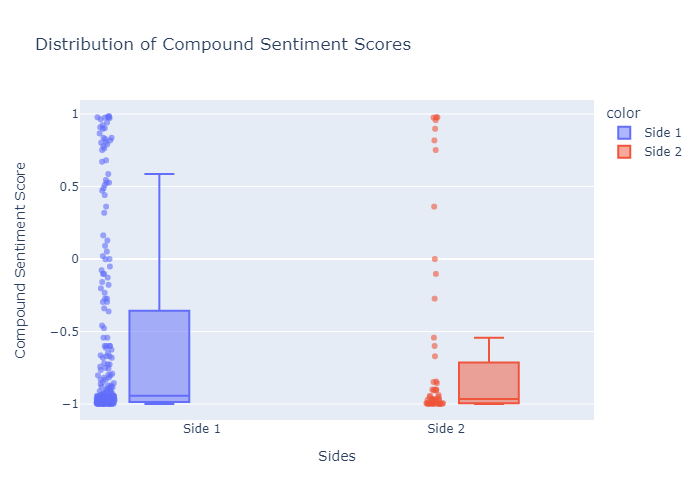

In [10]:
# Visualisation 2 : Distribution of Compound Sentiment Scores
fig2 = px.box(
    x=['Side 1'] * len(sentiment_df_1['compound']) + ['Side 2'] * len(sentiment_df_2['compound']),
    y=np.concatenate([sentiment_df_1['compound'], sentiment_df_2['compound']]),
    labels={"x": "Sides", "y": "Compound Sentiment Score"},
    color=['Side 1'] * len(sentiment_df_1['compound']) + ['Side 2'] * len(sentiment_df_2['compound']),
    title="Distribution of Compound Sentiment Scores",
    boxmode="group"
)

fig2.update_traces(
    boxpoints="all",  
    jitter=0.3,       
    pointpos=-1.8,    
    marker=dict(opacity=0.6)
)

fig2.update_layout(
    title="Distribution of Compound Sentiment Scores",
    xaxis_title="Sides",
    yaxis_title="Compound Sentiment Score",
    height = 500,
    autosize=True
)

fig2.write_html("wwii_distribution_mini.html")
fig2.write_image("wwii_distribution_mini.png")
Image('wwii_distribution_mini.png')

The distribution seems pretty similar among the two samples, however the sample sizes (n=295 for Side 1 and n=64 for Side 2)are imbalanced, which could contribute to the variability observed, particularly for Side 2.

Let's still conduct a T-test to confirm our observations. 

In [11]:
# Perform t-tests for Side 1 and Side 2
t_test_results = perform_t_tests(sentiment_df_1, sentiment_df_2)
print("\nT-Test Results:")
print(t_test_results)


T-Test Results:
    measure  t_statistic   p_value  significant
0       neg    -0.242389  0.809054        False
1       neu    -1.445459  0.151729        False
2       pos     1.771738  0.080265        False
3  compound     0.595366  0.553264        False


We conducted a Student's t-test, and the results confirm that there is absolutely no statistical significance.

However, it remains difficult to draw strong conclusions on this matter. Is our sample size too small? Are the movie plots not representative of the actual content of the films? Before delving deeper into this, let’s carry out the same analysis for Cold War films.

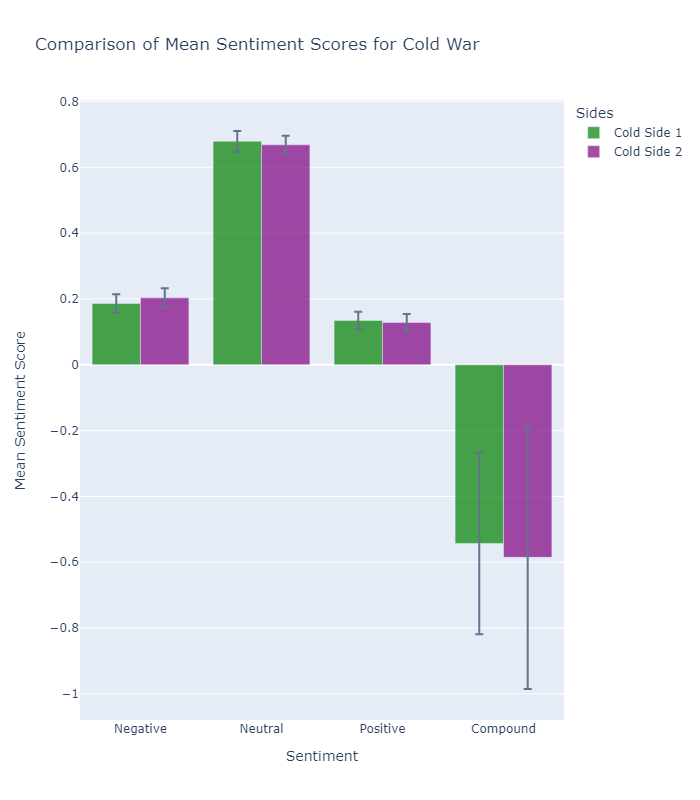

In [13]:
###COLD WAR###

labels = ['Negative', 'Neutral', 'Positive', 'Compound']
x = np.arange(len(labels))

# Confidence Interval Calculation for Cold War
ci_lower_3 = mean_scores_3 - ci_cold_side1['ci_lower'].values
ci_upper_3 = ci_cold_side1['ci_upper'].values - mean_scores_3

ci_lower_4 = mean_scores_4 - ci_cold_side2['ci_lower'].values
ci_upper_4 = ci_cold_side2['ci_upper'].values - mean_scores_4

# Create a bar chart with error bars for Cold War
fig3 = go.Figure()
fig3.add_trace(go.Bar(
    x=labels,
    y=mean_scores_3,
    name='Cold Side 1',
    error_y=dict(
        type='data',
        symmetric=False,
        array=ci_upper_3,
        arrayminus=ci_lower_3
    ),
    marker_color='green',
    opacity=0.7
))
fig3.add_trace(go.Bar(
    x=labels,
    y=mean_scores_4,
    name='Cold Side 2',
    error_y=dict(
        type='data',
        symmetric=False,
        array=ci_upper_4,
        arrayminus=ci_lower_4
    ),
    marker_color='purple',
    opacity=0.7
))


fig3.update_layout(
    title="Comparison of Mean Sentiment Scores for Cold War",
    xaxis_title="Sentiment",
    yaxis_title="Mean Sentiment Score",
    barmode='group',
    legend_title="Sides",
    height=800
)

# Visualisation 4 : Distribution of Compound Sentiment Scores for Cold War
fig4 = px.box(
    x=['Cold Side 1'] * len(sentiment_df_3['compound']) + ['Cold Side 2'] * len(sentiment_df_4['compound']),
    y=np.concatenate([sentiment_df_3['compound'], sentiment_df_4['compound']]),
    labels={"x": "Sides", "y": "Compound Sentiment Score"},
    color=['Cold Side 1'] * len(sentiment_df_3['compound']) + ['Cold Side 2'] * len(sentiment_df_4['compound']),
    title="Distribution of Compound Sentiment Scores for Cold War",
    boxmode="group"
)


fig4.update_traces(
    boxpoints="all",
    jitter=0.3,       
    pointpos=-1.8,    
    marker=dict(opacity=0.6)
)

fig4.update_layout(
    title="Distribution of Compound Sentiment Scores for Cold War",
    xaxis_title="Sides",
    yaxis_title="Compound Sentiment Score",
    height=800
)


fig3.write_html("comparison_mean_sentiment_cold_war.html")
fig3.write_image("comparison_mean_sentiment_cold_war.png")
Image("comparison_mean_sentiment_cold_war.png")


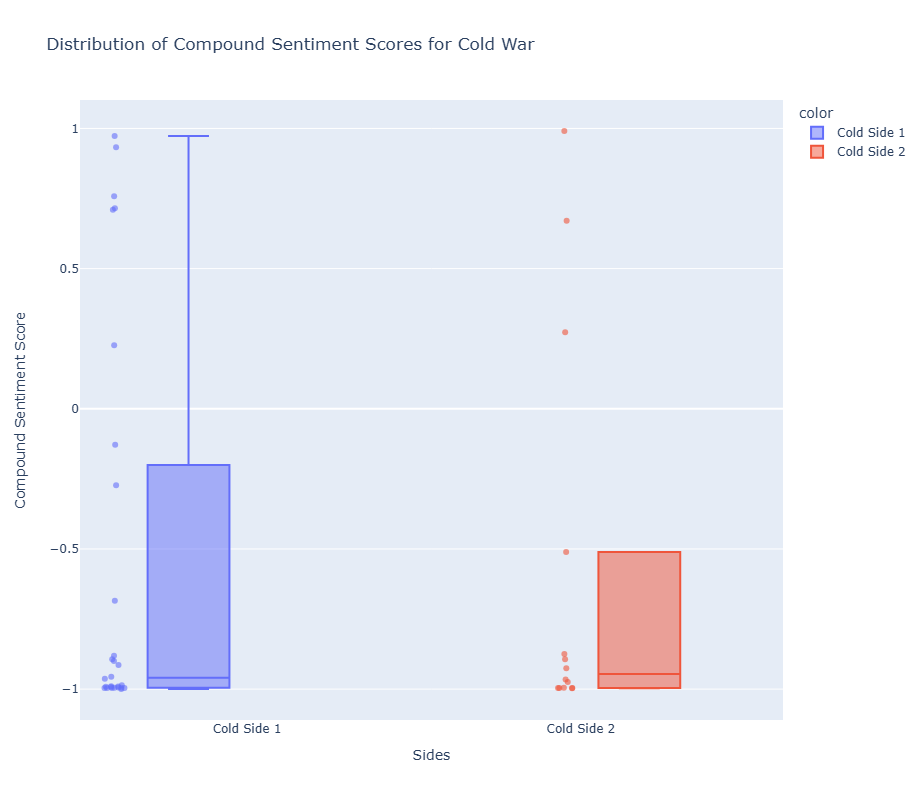

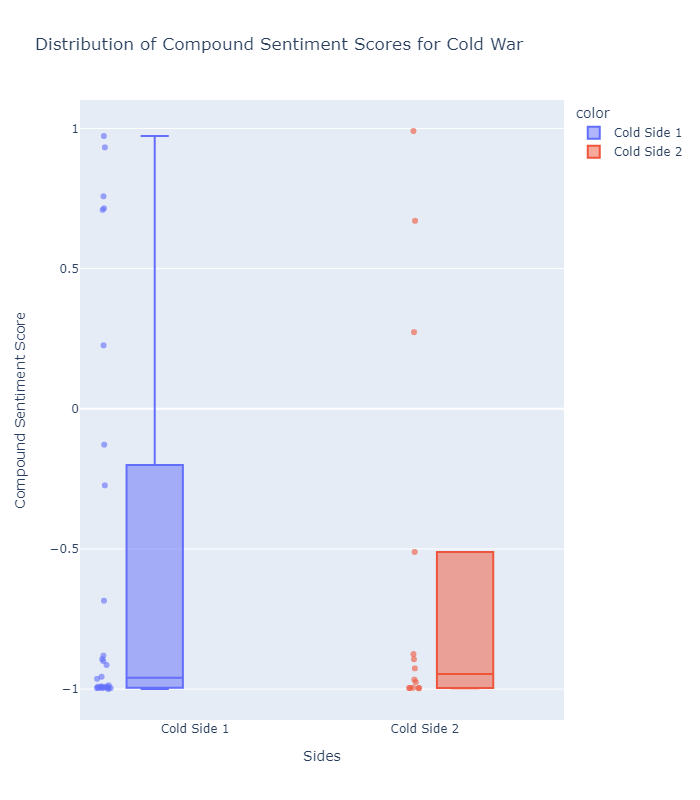

In [14]:
fig4.write_html("distribution_cold_war_sentiment.html")
fig4.write_image("distribution_cold_war_sentiment.png")
Image("distribution_cold_war_sentiment.png")

In [ ]:
# Perform t-tests for Side 1 and Side 2 for cold war
t_test_results = perform_t_tests(sentiment_df_3, sentiment_df_4)


print("\nT-Test Results:")
print(t_test_results)

In conclusion, the results for the Cold War are very similar. The slightly greater variability can be attributed to the smaller sample size.

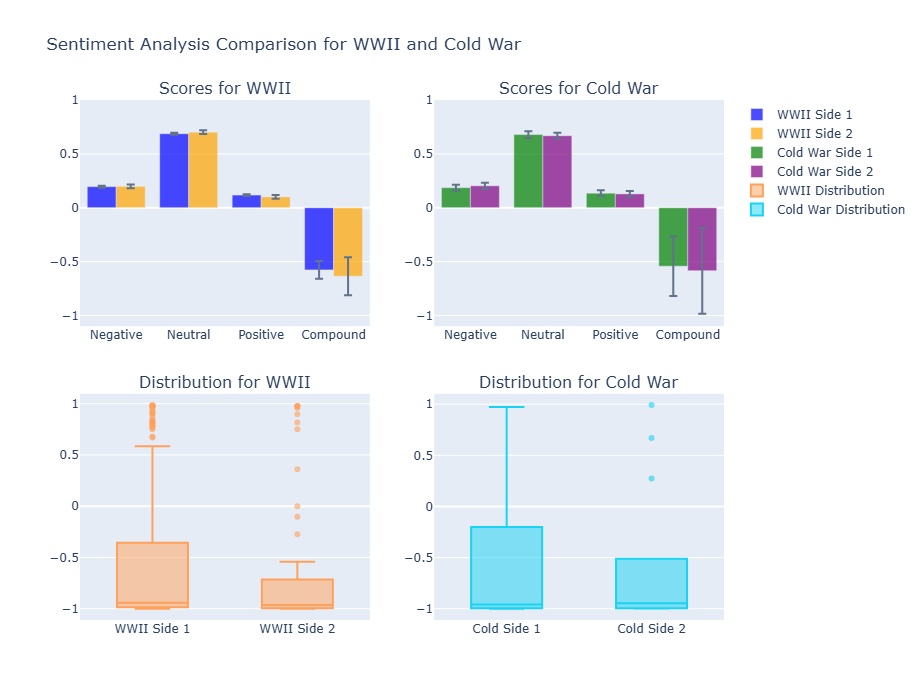

In [52]:


fig = create_global_sentiment_figure(
    mean_scores_1=mean_scores_1,
    mean_scores_2=mean_scores_2,
    mean_scores_3=mean_scores_3,
    mean_scores_4=mean_scores_4,
    ci_wwii_side1=ci_wwii_side1,
    ci_wwii_side2=ci_wwii_side2,
    ci_cold_side1=ci_cold_side1,
    ci_cold_side2=ci_cold_side2,
    sentiment_df_1=sentiment_df_1,
    sentiment_df_2=sentiment_df_2,
    sentiment_df_3=sentiment_df_3,
    sentiment_df_4=sentiment_df_4
)

fig.write_image("final_plot_sentiment.png")
Image("final_plot_sentiment.png")


### Named Entity Recognition

We will now go deeper into the analysis by extracting entities labeled as "ORGANIZATION" and performing entity-level sentiment analysis on them in order to uncover patterns in representation.

In [36]:
# Performing Named Entity Recognition
wars_iterator, war_names, side_iterator = named_entity_recognition(wars_df, wwii_movies_side1, wwii_movies_side2, cold_war_movies_side1, cold_war_movies_side2, lemmatizer, stop_words)

We then perform the sentiment analysis and display the results as heatmaps. They allow us to qualitatively highlight how military, political, and international organizations were characterized. 

For World War II, we were able to make three key observations:
* Military Authorities have an universally negative depiction
Regardless of the geopolitical side, military authorities are predominantly portrayed negatively before and after the conflict.
One key example of this phenomenon appears in the heatmaps of the Allied forces (before and after the conflict), where entities tagged with military ranks like “Commander” and “Infantry” consistently exhibit highly negative scores. This reflects a recurring portrayal of militarism as oppressive and destructive, particularly when analyzed over time. Even as the conflict resolves, negative sentiment toward military organizations persists.
* Political parties sentiment shift with context and time
The main example of this phenomenon is the portrayal of the Nazi Party in cultural narratives, which reveals temporal and cultural shifts.
On the first hand, in early Allied Forces representations, the Nazi Party occasionally exhibits positive sentiment scores. For example, the heatmap reveals a positive sentiment score of 0.61525 in the UK. This likely reflects pre-conflict ambivalence when the Nazi Party was not yet universally associated with its later actions. After the conflict, however, still in the western perspective, the party’s portrayal becomes uniformly negative, aligning with the global consensus on its role in the war.
On the other hand, in the Axis Forces’ heatmap, the Nazi Party is consistently portrayed with neutral to highly negative score, reflecting a post-war cultural reckoning within Germany.
* International Organizations as stabilizing roles
Entities like NATO and other international organizations show a trend of neutral sentiment, notably in Western narratives. For example, in the post-conflict Allied Forces’ heatmap, NATO maintains neutral scores, emphasizing their portrayal as stabilizing forces.



During the Cold War which was more an ideologicl conflict, Western media showed mixed sentiment toward entities, with negative views on organizations like the KGB and Communist Party, yet some US entities also faced criticism. This reflects freer speech allowing nuanced narratives despite overall hostility. Military concepts like DEFCON carried strong negative sentiments, mirroring fears of conflict.
Post-Cold War, sentiments toward Soviet bloc entities softened as tensions eased. In contrast, Soviet media consistently portrayed its allied entities, like the Bolshevik Party, positively (~0.8 sentiment), reflecting the controlled narratives of a tightly regulated media landscape.

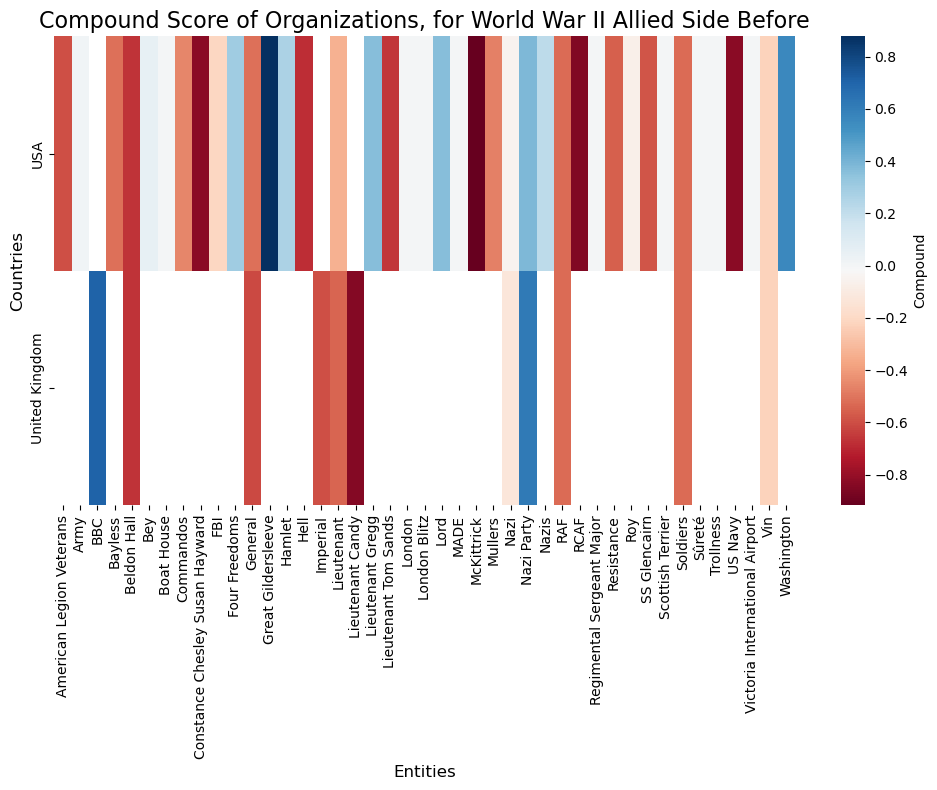

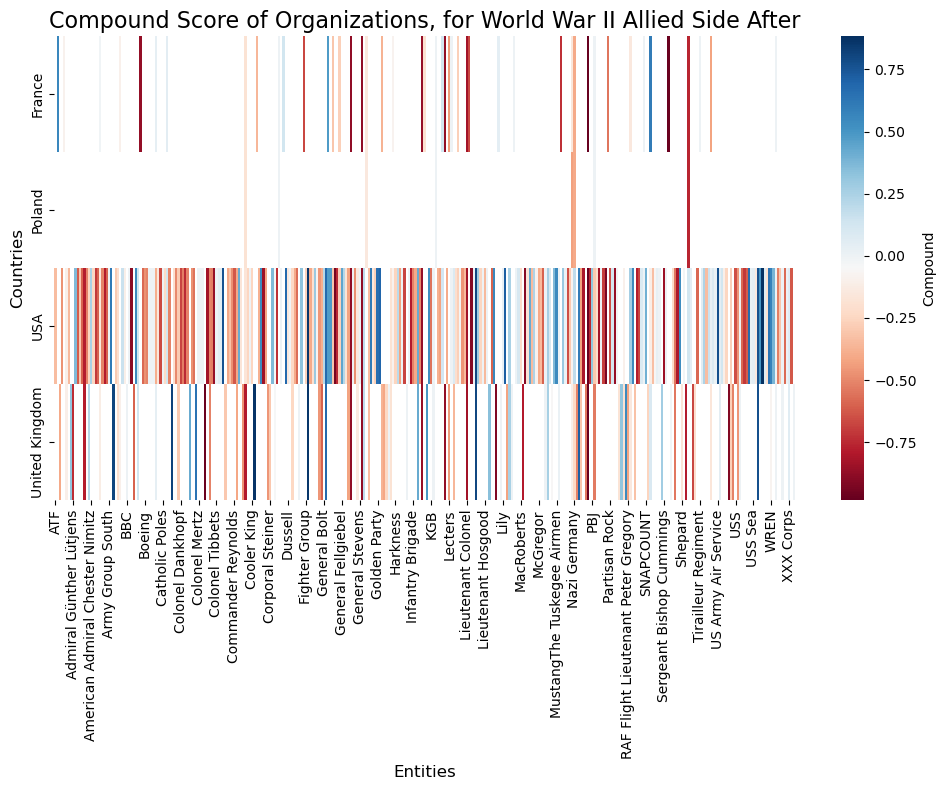

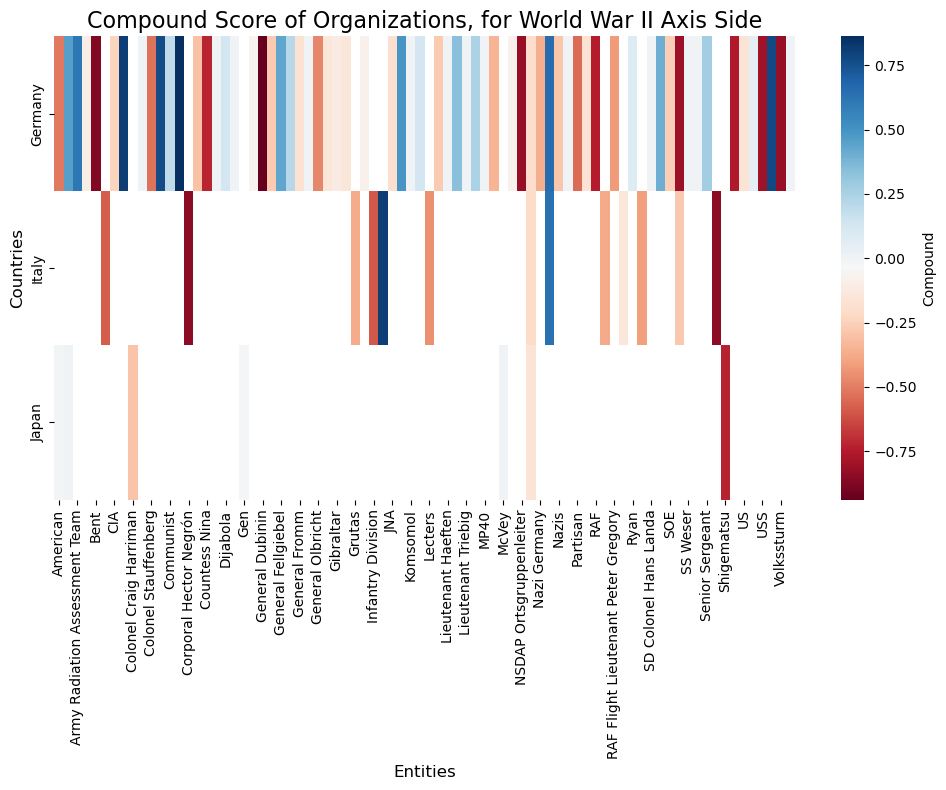

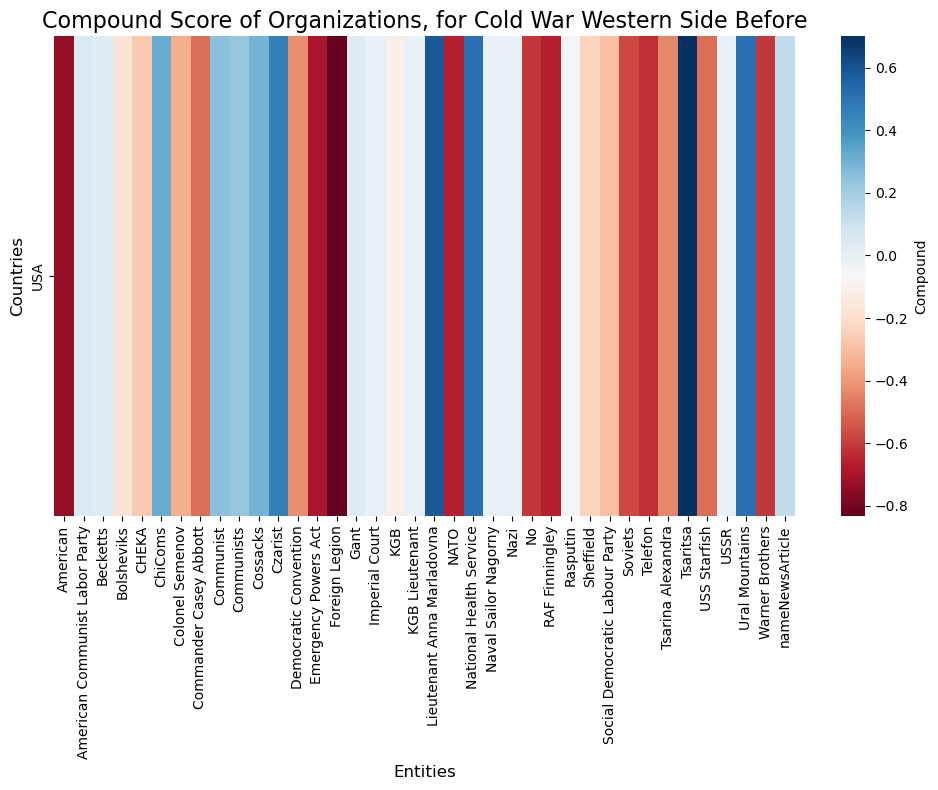

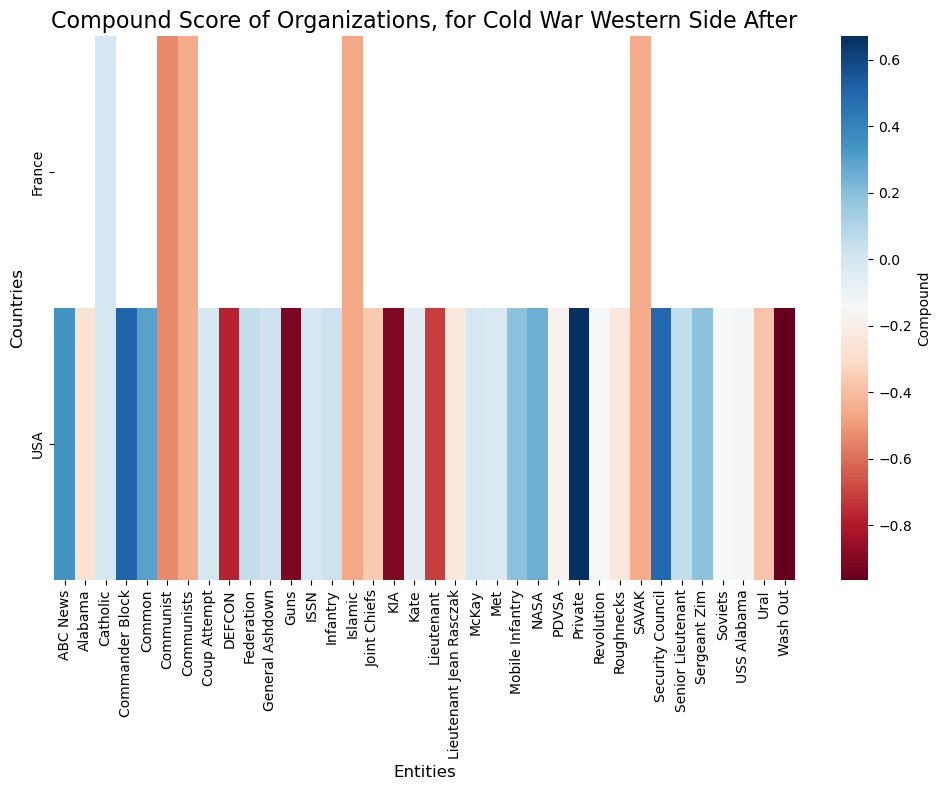

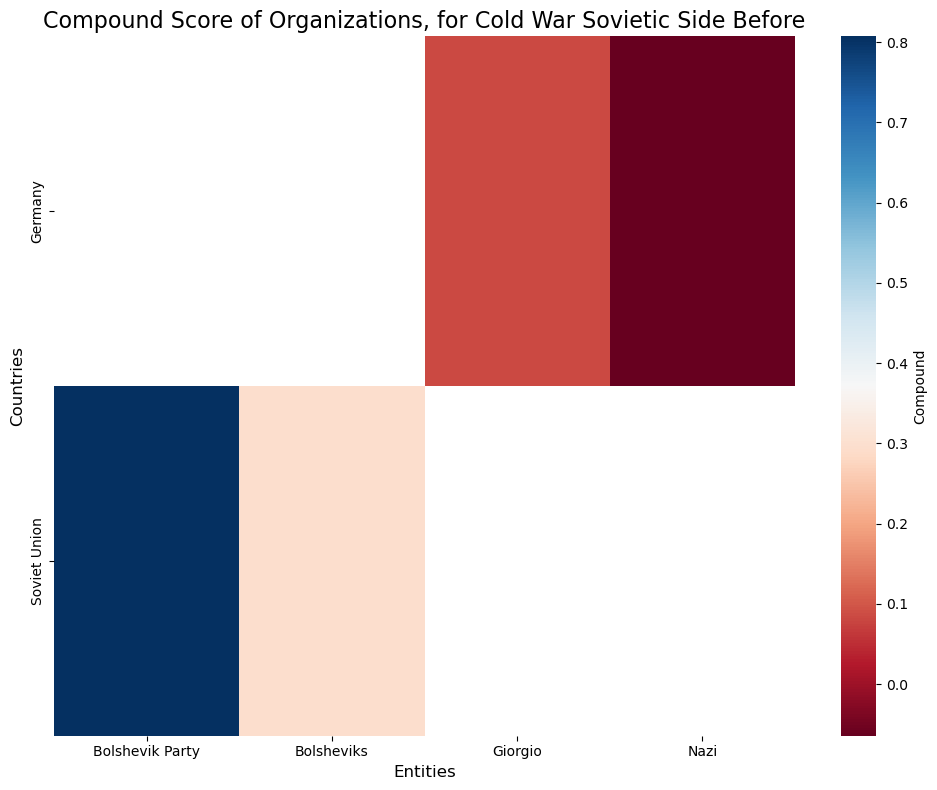

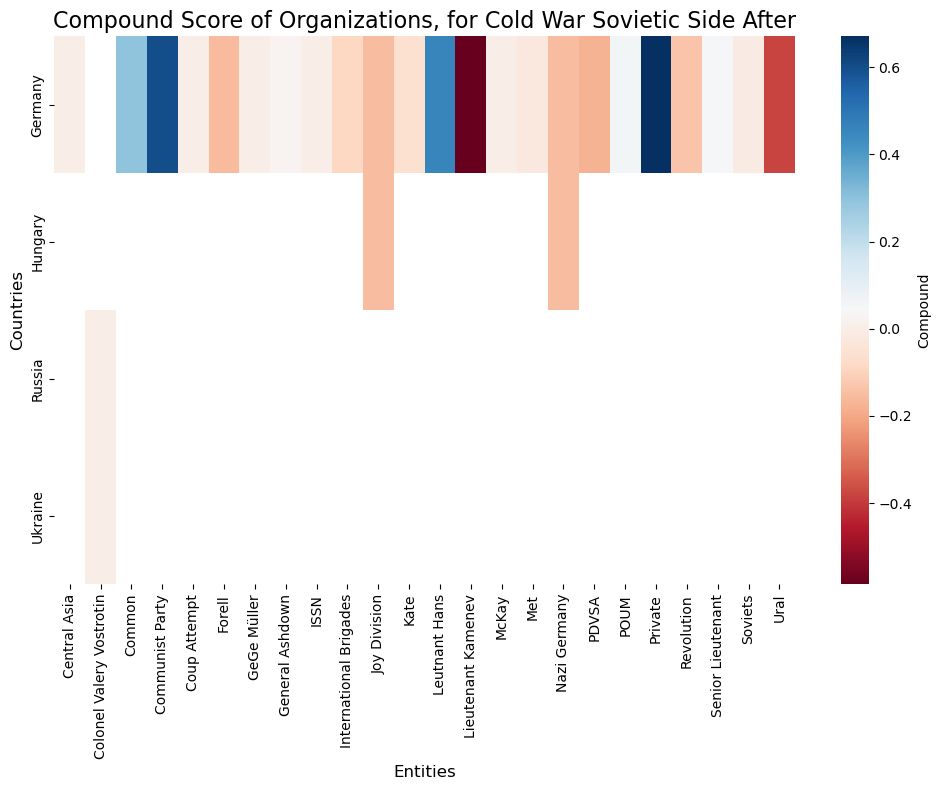

In [37]:

# Performing entity level sentiment analysis and plotting the corresponding heatmaps
entity_level_sent_analysis(wars_iterator, war_names, side_iterator)

For World War II, we were able to make three key observations:
* Military Authorities have an universally negative depiction
Regardless of the geopolitical side, military authorities are predominantly portrayed negatively before and after the conflict.
One key example of this phenomenon appears in the heatmaps of the Allied forces (before and after the conflict), where entities tagged with military ranks like “Commander” and “Infantry” consistently exhibit highly negative scores. This reflects a recurring portrayal of militarism as oppressive and destructive, particularly when analyzed over time. Even as the conflict resolves, negative sentiment toward military organizations persists.
* Political parties sentiment shift with context and time
The main example of this phenomenon is the portrayal of the Nazi Party in cultural narratives, which reveals temporal and cultural shifts.
On the first hand, in early Allied Forces representations, the Nazi Party occasionally exhibits positive sentiment scores. For example, the heatmap reveals a positive sentiment score of 0.61525 in the UK. This likely reflects pre-conflict ambivalence when the Nazi Party was not yet universally associated with its later actions. After the conflict, however, still in the western perspective, the party’s portrayal becomes uniformly negative, aligning with the global consensus on its role in the war.
On the other hand, in the Axis Forces’ heatmap, the Nazi Party is consistently portrayed with neutral to highly negative score, reflecting a post-war cultural reckoning within Germany.
* International Organizations as stabilizing roles
Entities like NATO and other international organizations show a trend of neutral sentiment, notably in Western narratives. For example, in the post-conflict Allied Forces’ heatmap, NATO maintains neutral scores, emphasizing their portrayal as stabilizing forces.



During the Cold War which was more an ideologicl conflict, Western media showed mixed sentiment toward entities, with negative views on organizations like the KGB and Communist Party, yet some US entities also faced criticism. This reflects freer speech allowing nuanced narratives despite overall hostility. Military concepts like DEFCON carried strong negative sentiments, mirroring fears of conflict.
Post-Cold War, sentiments toward Soviet bloc entities softened as tensions eased. In contrast, Soviet media consistently portrayed its allied entities, like the Bolshevik Party, positively (~0.8 sentiment), reflecting the controlled narratives of a tightly regulated media landscape.